# Image Captioning Final Project

In this final project you will define and train an image-to-caption model, that can produce descriptions for real world images!

<img src="images/encoder_decoder.png" style="width:70%">

Model architecture: CNN encoder and RNN decoder. 
(https://research.googleblog.com/2014/11/a-picture-is-worth-thousand-coherent.html)

# Import stuff

In [39]:
import sys
sys.path.append("..")
import grading
import download_utils

In [40]:
download_utils.link_all_keras_resources()

In [41]:
import tensorflow as tf
from tensorflow.contrib import keras
import numpy as np
%matplotlib inline
import matplotlib.pyplot as plt
L = keras.layers
K = keras.backend
import tqdm
import utils
import time
import zipfile
import json
from collections import defaultdict
import re
import random
from random import choice
import grading_utils
import os

# Fill in your Coursera token and email
To successfully submit your answers to our grader, please fill in your Coursera submission token and email

In [42]:
grader = grading.Grader(assignment_key="NEDBg6CgEee8nQ6uE8a7OA", 
                        all_parts=["19Wpv", "uJh73", "yiJkt", "rbpnH", "E2OIL", "YJR7z"])

In [43]:
# token expires every 30 min
COURSERA_TOKEN = "1BF8ttpwNiNw45vB"### YOUR TOKEN HERE
COURSERA_EMAIL = "kindresh44@gmail.com"### YOUR EMAIL HERE

## Download data

Takes 10 hours and 20 GB. We've downloaded necessary files for you.

Relevant links (just in case):
- train images http://msvocds.blob.core.windows.net/coco2014/train2014.zip
- validation images http://msvocds.blob.core.windows.net/coco2014/val2014.zip
- captions for both train and validation http://msvocds.blob.core.windows.net/annotations-1-0-3/captions_train-val2014.zip

In [44]:
# we downloaded them for you, just link them here
download_utils.link_week_6_resources()

# Extract image features

We will use pre-trained InceptionV3 model for CNN encoder (https://research.googleblog.com/2016/03/train-your-own-image-classifier-with.html) and extract its last hidden layer as an embedding:

<img src="images/inceptionv3.png" style="width:70%">

In [45]:
IMG_SIZE = 299

In [46]:
# we take the last hidden layer of IncetionV3 as an image embedding
def get_cnn_encoder():
    K.set_learning_phase(False)
    model = keras.applications.InceptionV3(include_top=False)
    preprocess_for_model = keras.applications.inception_v3.preprocess_input

    model = keras.models.Model(model.inputs, keras.layers.GlobalAveragePooling2D()(model.output))
    return model, preprocess_for_model

Features extraction takes too much time on CPU:
- Takes 16 minutes on GPU.
- 25x slower (InceptionV3) on CPU and takes 7 hours.
- 10x slower (MobileNet) on CPU and takes 3 hours.

So we've done it for you with the following code:
```python
# load pre-trained model
K.clear_session()
encoder, preprocess_for_model = get_cnn_encoder()

# extract train features
train_img_embeds, train_img_fns = utils.apply_model(
    "train2014.zip", encoder, preprocess_for_model, input_shape=(IMG_SIZE, IMG_SIZE))
utils.save_pickle(train_img_embeds, "train_img_embeds.pickle")
utils.save_pickle(train_img_fns, "train_img_fns.pickle")

# extract validation features
val_img_embeds, val_img_fns = utils.apply_model(
    "val2014.zip", encoder, preprocess_for_model, input_shape=(IMG_SIZE, IMG_SIZE))
utils.save_pickle(val_img_embeds, "val_img_embeds.pickle")
utils.save_pickle(val_img_fns, "val_img_fns.pickle")

# sample images for learners
def sample_zip(fn_in, fn_out, rate=0.01, seed=42):
    np.random.seed(seed)
    with zipfile.ZipFile(fn_in) as fin, zipfile.ZipFile(fn_out, "w") as fout:
        sampled = filter(lambda _: np.random.rand() < rate, fin.filelist)
        for zInfo in sampled:
            fout.writestr(zInfo, fin.read(zInfo))
            
sample_zip("train2014.zip", "train2014_sample.zip")
sample_zip("val2014.zip", "val2014_sample.zip")
```

In [47]:
# load prepared embeddings
train_img_embeds = utils.read_pickle("train_img_embeds.pickle")
train_img_fns = utils.read_pickle("train_img_fns.pickle")
val_img_embeds = utils.read_pickle("val_img_embeds.pickle")
val_img_fns = utils.read_pickle("val_img_fns.pickle")
# check shapes
print(train_img_embeds.shape, len(train_img_fns))
print(val_img_embeds.shape, len(val_img_fns))

(82783, 2048) 82783
(40504, 2048) 40504


In [48]:
# check prepared samples of images
list(filter(lambda x: x.endswith("_sample.zip"), os.listdir(".")))

['train2014_sample.zip', 'val2014_sample.zip']

In [49]:
train_img_embeds[0]

array([ 0.13804615,  0.05108397,  0.22299135, ...,  0.03206269,
        0.00304687,  0.52839714], dtype=float32)

# Extract captions for images

In [50]:
# extract captions from zip
def get_captions_for_fns(fns, zip_fn, zip_json_path):
    zf = zipfile.ZipFile(zip_fn)
    j = json.loads(zf.read(zip_json_path).decode("utf8"))
    id_to_fn = {img["id"]: img["file_name"] for img in j["images"]}
    print(type(id_to_fn))
    fn_to_caps = defaultdict(list)
    for cap in j['annotations']:
        fn_to_caps[id_to_fn[cap['image_id']]].append(cap['caption'])
    fn_to_caps = dict(fn_to_caps)
    return list(map(lambda x: fn_to_caps[x], fns))
    
train_captions = get_captions_for_fns(train_img_fns, "captions_train-val2014.zip", 
                                      "annotations/captions_train2014.json")

val_captions = get_captions_for_fns(val_img_fns, "captions_train-val2014.zip", 
                                      "annotations/captions_val2014.json")

# check shape
print(len(train_img_fns), len(train_captions))
print(len(val_img_fns), len(val_captions))

<class 'dict'>
<class 'dict'>
82783 82783
40504 40504


In [51]:
zf1 = zipfile.ZipFile("captions_train-val2014.zip")
j1 = json.loads(zf1.read("annotations/captions_train2014.json").decode("utf8"))
j1.keys()

dict_keys(['info', 'images', 'licenses', 'annotations'])

In [52]:
j1["images"]
id_to_fn1 = {img["id"]:img["file_name"] for img in j1["images"]}
id_to_fn1

{57870: 'COCO_train2014_000000057870.jpg',
 384029: 'COCO_train2014_000000384029.jpg',
 222016: 'COCO_train2014_000000222016.jpg',
 520950: 'COCO_train2014_000000520950.jpg',
 69675: 'COCO_train2014_000000069675.jpg',
 547471: 'COCO_train2014_000000547471.jpg',
 122688: 'COCO_train2014_000000122688.jpg',
 392136: 'COCO_train2014_000000392136.jpg',
 398494: 'COCO_train2014_000000398494.jpg',
 90570: 'COCO_train2014_000000090570.jpg',
 504616: 'COCO_train2014_000000504616.jpg',
 161919: 'COCO_train2014_000000161919.jpg',
 457732: 'COCO_train2014_000000457732.jpg',
 44404: 'COCO_train2014_000000044404.jpg',
 4428: 'COCO_train2014_000000004428.jpg',
 170558: 'COCO_train2014_000000170558.jpg',
 405613: 'COCO_train2014_000000405613.jpg',
 283524: 'COCO_train2014_000000283524.jpg',
 37015: 'COCO_train2014_000000037015.jpg',
 71631: 'COCO_train2014_000000071631.jpg',
 491269: 'COCO_train2014_000000491269.jpg',
 365363: 'COCO_train2014_000000365363.jpg',
 64460: 'COCO_train2014_000000064460.jpg

In [15]:
#train_img_fns

['COCO_train2014_000000270070.jpg',
 'COCO_train2014_000000101772.jpg',
 'COCO_train2014_000000359320.jpg',
 'COCO_train2014_000000486482.jpg',
 'COCO_train2014_000000116155.jpg',
 'COCO_train2014_000000082143.jpg',
 'COCO_train2014_000000242307.jpg',
 'COCO_train2014_000000510484.jpg',
 'COCO_train2014_000000339597.jpg',
 'COCO_train2014_000000366396.jpg',
 'COCO_train2014_000000363942.jpg',
 'COCO_train2014_000000244928.jpg',
 'COCO_train2014_000000239417.jpg',
 'COCO_train2014_000000045059.jpg',
 'COCO_train2014_000000556018.jpg',
 'COCO_train2014_000000328391.jpg',
 'COCO_train2014_000000441327.jpg',
 'COCO_train2014_000000544001.jpg',
 'COCO_train2014_000000514930.jpg',
 'COCO_train2014_000000036618.jpg',
 'COCO_train2014_000000452782.jpg',
 'COCO_train2014_000000093424.jpg',
 'COCO_train2014_000000288025.jpg',
 'COCO_train2014_000000269605.jpg',
 'COCO_train2014_000000110484.jpg',
 'COCO_train2014_000000239180.jpg',
 'COCO_train2014_000000267956.jpg',
 'COCO_train2014_00000052406

In [53]:
fn_to_caps = defaultdict(list)
for cap in j1["annotations"]:
    fn_to_caps[id_to_fn1[cap['image_id']]].append(cap['caption'])
#fn_to_caps

In [ ]:
for cap in j1["annotations"]:
    print(cap["image_id"])

318556
116100
318556
116100
379340
379340
318556
318556
134754
538480
476220
299675
32275
302443
134754
25470
513461
18691
285579
266366
226658
299675
124567
293605
321194
479495
539984
28231
538480
350235
314265
389006
134754
31813
538480
465049
360334
524679
279672
385716
44816
116100
302443
360306
122802
539984
28231
515040
299675
161657
266366
72704
266366
321194
385716
28149
257263
520049
124567
503598
230843
231029
174028
480489
520049
385716
538480
56972
187042
31813
101891
360306
124567
90359
360334
90359
213532
302443
24091
302443
372427
376047
577876
47093
266366
299675
374873
32275
360334
360053
25470
517565
543882
134754
517565
389006
124567
38682
539984
28231
374873
568117
56972
389006
302443
31813
186620
360306
38682
213532
568117
38682
360306
318556
116100
186620
226658
279672
376047
480489
517565
231029
122802
4377
314265
90359
31813
24091
18691
539984
28231
517565
72704
360053
213532
515040
480489
174028
32275
503598
189278
170045
18691
416172
360306
72704
374873
30951

417276
320875
523700
47418
360870
47418
527858
45926
531614
95753
435809
124142
258026
434190
49581
505863
244367
475815
77842
69616
579446
430405
471480
545731
239457
560015
435809
258705
484304
418168
360870
95753
69616
295776
53977
570297
241911
544516
511930
255925
74127
195583
401777
168239
190187
49592
243434
439865
427493
276913
243434
258026
204074
494199
53335
385753
507838
53335
303879
418168
424560
533125
505863
244367
466390
243434
570297
233863
570297
239457
496018
255925
524695
540795
49346
533441
545160
279041
258026
232375
263734
290866
224895
405582
467038
232375
466390
579446
531614
467038
194907
45101
58553
496018
224895
276913
461597
401777
467038
385753
114979
231253
258026
194907
239457
78652
223560
49346
533441
258026
466390
505863
244367
49346
533441
204074
466390
53335
507838
540795
466390
504664
231253
194907
385753
224895
386341
545731
418168
303879
494199
484304
284756
492754
249058
424560
540795
45101
287253
159457
195583
255925
279041
301047
107565
290153


296360
15198
335380
241491
493547
479202
26488
196510
23280
7420
434118
357865
244014
414828
225363
416281
452775
256230
102319
441459
285998
183068
225363
307435
182019
512736
272072
106964
233537
122939
29962
186554
142896
541596
363549
434156
523484
114830
182019
400107
185087
174876
33943
183068
386326
384029
227652
262845
222829
52619
183068
256967
174876
15198
486421
135733
268454
455342
53756
106123
385426
509806
262845
77643
469389
441459
570066
10799
378415
215738
255804
227241
570066
335380
441459
22806
10799
511814
299782
357010
542213
511814
10799
332202
99966
77643
469389
155937
255804
145129
542213
153655
335380
53756
578276
122939
385426
229142
155937
186554
298182
256967
416281
400107
77643
469389
509806
229142
386326
384029
59947
363940
195151
130458
185087
347555
511814
414828
187972
434156
463739
539710
256550
59947
296360
142896
455342
271604
400107
539710
59947
398142
434156
27451
385426
324764
486421
378415
578276
14730
475316
455342
452775
256230
363940
325758
19

503401
571513
215782
198308
191858
386236

124133
392030
423776
255614
255614
4051
111043
34884
466132
538922
538922
553528
442249
19637
507370
124133
378071
556660
406767
154337
343908
376279
184159
406767
15156
148541
50480
373639
48892
147778
553528
411171
300159
214210
7796
411171
184159
331759
214210
99453
61606
336984
547533
343908
194748
184159
4051
337707
214210
255614
147778
364770
532520
330573
48892
411171
556660
237538
149320
96222
92909
223023
117542
331759
220226
337707
99453
442249
161919
149320
412720
184159
580191
222600
349390
99453
435042
42293
335318
575206
148541
546647
422810
336984
50480
562575
479400
466132
546647
461916
111141
386684
241905
336984
337321
489199
466132
330951
364032
111141
490596
553528
311925
493428
376279
260035
269913
260035
269913
423776
406767
19797
287136
349390
580191
147778
311925
42293
220226
241905
105192
264663
575206
378071
502422
336984
390710
7796
408995
363022
105192
96222
547533
349390
502422
422810
40248
411171
446014
260035
269

375382
184556
405437
499135
441461
90065
193047
405437
158370
554152
385858
169902
227935
167346
547636
167346
167346
554152
307483
159038
107424
43895
391213
102529
499135
441461
575274
375382
160996
173821
307483
139500
253789
265589
375382
499135
441461
314693
64310
198436
329752
340425
78059
233955
196944
370738
499135
441461
457827
229962
26108
23137
59116
365927
365927
522269
177090
31537
226695
160996
37126
37126
265589
46816
9462
393601
522280
160996
250827
409658
405437
203129
281742
575274
504336
551144
160996
261688
460987
488768
205967
342709
391213
102529
448613
437304
78059
132188
159038
457827
308059
256535
31537
159038
523010
371786
171353
514602
518445
46118
187465
529030
178785
40572
225713
388615
171353
485491
562589
201145
187518
568689
192266
522535
406533
38850
502914
522535
523010
368397
178770
283502
187465
38850
447885
98892
423341
359364
343878
568689
568689
346503
548278
280540
420045
371786
280674
153067
187465
522535
377273
280674
246839
462208
427832
51460

166998
84147
33332
576676
283279
152060
123552
394071
232689
521025
425430
22228
107633
299413
396010
167743
100319
2585
447150
395221
362192
167743
221717
122964
224272
329878
49522
22636
245810
42493
224272
49522
126317
256806
107225
128369
373722
18809
283825
394412
354035
316132
433910
523412
140243
510377
20583
15109
167708
422452
22228
332217
100319
2585
274551
480157
360179
182129
226383
349521
218546
366184
394412
528243
332217
274446
551746
340065
564884
292835
292835
215855
557374
441488
385390
340321
510377
447150
140243
494895
70239
490959
96693
454814
550359
379294
510377
435452
550359
18809
256806
441488
95526
373722
283279
308979
363455
340321
307030
277141
564646
126317
396010
538058
161384
49522
362499
103773
161384
40931
6178
100744
464859
521025
176955
332217
494895
564884
422452
500515
187157
283825
128369
103773
107633
362499
205525
232689
422452
70239
256806
208956
502508
502508
239584
340321
107633
226383
193384
340321
128369
283279
564646
292835
494895
161384
42

210322
537441
308911
572040
221317
342843
164339
44404
203492
123722
559544
164339
264092
515893
540858
282234
457268
263974
88759
491742
504616
240709
396137
44080
440532
264092
210322
537441
398073
30569
119706
221317
259137
396137
188287
4129
154167
30569
418141
298193
86934
375728
329147
188287
41459
232490
88192
161809
259137
531948
274758154167
255770
274758
78546
78546
114540
426675
492065
98480
179915
432226
84959
179915
298193
293658
259414
436504
277470
39083
84959
541973
457268
63325
68712
142276
461841
55733
432226
282283
314538
195911
210322
537441
84959
451836
430394
451836
577126
298193
142276
213539
513466
314538
436649
195911
76100
443084
255525
470072
88192
346121
298193
487036
513466
119706
430394
107157
98480
414651
431812
76100
520975
298193
560525
119706
142276
402177
55733
531948
39083
174901
83873
451836
42871
495518
164386
203143
358484
213539
28589
414651
430394
541973
110516
576757
423425
431812
530645
1332
255770
492065
530645
179915
398285
431812
541973
418

325057
460100
471871
505023
455632
473516
24861
253873
531647
472130
536827
402335
503809
510216
429712
548118
1895
430122
247871
429712
560409
112747
118918
72538
162452
455160
429712
107425
556424
325057
501299
266659
103877
66859
189390
400625
527649
578484
126707
117325
118918
325057
483817
325057
2217
129108
575860
313705
267927
253873
455632
581396
535917
501299
2217
72538
188350
129108
293805
325310
83878
1895
394283
129108
107425
280270
258108
72538
471871
505023
539755
120044
402335
278753
472130
375296
501299
496776
471871
288889
521379
205486
483817
1895
475774
195861
471871
239244
168440
375296
475774
76681
496776
413723
2415
24861
556424
81043
378786
578484
325057
539755
284047
163047
168440
95409
216840
351221
205679
573125
255471
183953
299371
354679
205679
378786
430122
548118
413723
101132
24861
402335
379067
430122
356382
501299
284047
421893
443701
483817
443701
255471
183953
154693
451287
9885
556424
288889
573125
299371
76681
280270
135564
400619
195861
464179
2679

184497
390342
184497
497415
577447
21622
73680
352623
574579
451522
436619
453553
34246
577447
116074
105820
521671
431133
71769
445080
453553
6800
503554
59892
395850
312828
207339
402257
344998
207339
310989
521671
59551
436619
234378
260111
574579
6800
6800
175418
453553
54874
266114
154972
558044
133048
451522
347989
51379
207339
311250
104739
73680
395495
105820
255808
18370
424820
59892
260111
27616
490850
231902
231902
253122
277795
79481
31938
453553
374114
152461
340258
308175
277795
366812
184497
116074
35101
133048
133048
411263
234378
310989
31938
71769
31938
572206
577447
260111
445080
311250
351112
311250
19385
105820
71769
572316
577447
540840
253122
359678
540840
308175
123901
344661
54874
266114
497033
59892
497033
352623
521671
200446
393945
537379
233456
18370
454372
59892
146599
220912
27616
450346
234378
51379
310989
308175
497415
27616
521671
352623
398575
153495
390342
574213
54874
266114
312828
79481
35101
200446
175418
154972
533988
548273
7944
146599
374114
55

401312
287105
254176
60600
454659
72899
262561
389382
128320
486002
69559
505388
11877
64834
436046
453260
497001
465906
341369
121302
527816
171012
139403
328210
190547
21599
465613
397792
50222
550112
285149
60600
360606
258501
67361
64834
408445
387876
78729
263599
282198
96526
69209
263599
205918
141013
263599
248389
475441
350497
387876
418818
357894
550112
116994
546088
242001
64834
145825
262561
551647
341369
367131
82676
461561
567049
563177
210580
167634
526877
391422
27002
342532
15379
160201
172852
212589228474
521471
92088
326182
391839
506965
258501
547135
206385
24434
458505
384700
206394
251702
487144
59494
579341
224081
78729
475074
459543
290192
474202
189223
354205
109572
224081
364301
473517
340699
90307
258501
127905
490184
280980
133086
84284
248280
535573
313525
482296
524848
279422
209772
84284
459543
129032
529671
9511
391839
141316
96630
459543
364301
337013
224081
36757
134113
182642
96436
429820
51176
5453
331738
323733
342532
76014
352417
206385
235602
49815

375380
71055
75369
296257
455476
466580
214932
556202
72601
362130
489741
426979
469595
312137
469139
531391
469595
366770
302250
296257
215357
575743
198547
339886
375380
71055
218649
135135
469139
556202
338169
446088
322771
338169
214932
361583
268212
234755
244674
375380
71055
581057
481504
325569
336643
243071
559747
46373
103513
176761
462398
559747
358744
489741
409451
495243
441891
531391
243071
523273
302250
479095
64908
447379
342160
26072
225848
37956
33842
402191
214932
551594
436558
317733
338059
420500
104249
176761
361583
214932
447379
225848
402624
75369
455476
108210
436558
317733
420500
481504
449847
177817
436558
26072
198547
462398
103513
470398
436558
469595
436002
526172
198547
455476
64908
379651
581057
479825
366770
218649
479403
526172
454336
420500
338059
523273
382400
317733
299111
366770
402624
342160
353080
214273
72601
514864
449847
479403
470398
319917
312137
176761
110445
234755
175250
239885
402624
420500
312137
113455
495243
466580
175250
514864
507532

258381
340689
269890
130070
473793
473793
354131
262299
173258
77455
71675
418624
358756
78009
389884
281133
262299
536830
302503
283960
567124
80371
399488
319581
39014
410622
270871
548013
384909
410622
419963
439373
78828
446807
2703
340689
77455
130070
433968
405848
548515
2703
422758
123753
516581
153507
571168
383525
433968
77455
389884
385381
269890
516581
258027
150641
64256
473222
322992
447731
281133
447731
78828
64256
153507
123753
12138
494642
179698
254692
28878
473261
348436
516587
51563
193829
270871
52068
77806
405848
105777
193829
179698
405848
258027
333363
421314
421314
78828
203655
220289
338963
176810
571168
352508
411266
473222
322992
410898
66642
548515
383525
225829
439373
220289
176810
192164
411266
446807
354235
201252
446807
64256
82770
61137
411266
163351
277461
167644
179698
568023
400118
8432
225829
163351
262909
61137
78828
494642
61137
193829
558387
254692
78828
150641
258819
55648
522339
410622
105777
479697
163351
358684
411266
410898
548564
64256
5683

410190
302213
298848
100669
235842
413869
419501
298848
212690
154140
235842
550310
546472
242582
5638
446864
253467
235842
154652
126070
302213
572508
292055
410190
164920
100669
404013
355950
366204
163370
318365
94527
286678
546472
154652
257118
318491
513210
573875
378194
415370
235842
410190
44913
157476
307153
326290
57005
235842
404013
189785
286678
186944
516945
166009
119304
189785
550104
419501
196777
119304
318365
574257
375535
126070
131674
226148
545781
302213
145748
352248
494041
268643
154140
78477
77550
413533
61502
426853
166009
126070
6539
523346
157476
550310
352248
352248
534058
352248
337297
105096
105096
95990
322952
407972
513210
6539
26049
352248
378611
5638
246539
378611
465235
550104
164920
377023
313397
5638
571105
132331
507243
268643
378611
321940
94527
465235
165062
163370
564861
410190
378611
530640
188575
309599
108266
513978
84602
88025
534058
549442
105096
368373
253467
313807
362685
523346
313397
372560
313807
131674
177755
564861
397645
366641
318365

314556
250569
76493
3264
64324
122415
335184
122415
91553
384021
123835
423749
10476
335184
399095
129894
250569
392197
456109
342045
342045
198072
369516
535424
581766
65924
464536
464536
272492
417234
123835
423749
198404
270912
541832
479372
188252
167027
184866
573284
16758
191363
58565
216413
432467
167027
311776
456109
410675
571048
123835
423749
330136
411645
535424
384021
27764
581766
64324
464536
1107
58565
216413
478403
456109
535424
129894
279787
314556
432467
95267
198514
16758
191363
421887
52231
328494
485632
311776
330136
64324
184866
573284
52231
224800
435553
328494
198072
432467
319938
574028
224800
367935
442819
485632
535676
430343
304518
129894
158080
40286
392202
147698
478403
76493
270912
279787
363827
129940
573284
314556
280951
351161
324443
324443
58565
216413
478403
311776
95267
351161
224942
224800
328494
421887
65924
511752
58565
216413
459465
464536
99041
224005
226488
581766
541832
251453
235237
18938
272492
417234
330136
158080
224005
403249
167027
49106

383212
110353
38134
464630
22456
165955
183413
102670
102670
458463
146131
204716
81085
559682
82611
165955
577448
91550
204716
365565
78364
164891
360374
421297
47230
274986
107262
95902
208882
504494
343291
87671
559682
342965
208882
440786
209275
183413
422298
209574
516410
45492
228799
518823
296330
208882
496210
421297
349669
564186
77020
565665
324456
516410
115637
507440
167234
383212
209275
81085
213364
538116
504494
464630
167234
360374
204716
359529
476501
182112
47230
80518
50868
479134
192390
35032
480926
101632
487225
154755
338960
475763
192390
534155
70809
570338
95903
101632
285679
475763
251210
398878
249128
95903
219303
47692
253054
579137
302141
91508
423842
519145
168475
56675
433619
149546
125711
563029
219303
423842
302141
47692
343630
34752
502183
451016
23089
466277
287877
9509
494125
61966
398878
474108
37396
561888
537617
475763
61966
38808
173316
348826
249128
38808
198786
38808
227552
215896
403518
338960
494360
502183
141603
19694
321583
343630
393396
91917

165160
448436
400740
307270
48139
581708
147969
295074
339550
45954
36950
398649
61206
44454
134685
362309
265333
29456
150867
320533
398649
280241
554436
128351
161463
320533
187473
177604
462292
546651
489267
448436
49478
554436
365677
492293
528372
562937
336887
103819
11373
45954
320533
184325
570423
285628
360317
184325
314310
562937
307949
433413
370824
557191
176440
29456
365677
545253
462292
546651
550610
175751
190353
239728
265557
490187
186233
175751
253866
334708
332821
209534
150867
448436
156876
489267
16578
444173
196178
448436
116794
550610
518859
444173
526534
494498
147969
307270
753
289341
410356
100413
462292
546651
285628
360317
158873
280241
68958
261316
48194
294380
294380
444173
518859
48139
492293
332821
528130
36950
265557
106045
753
175751
513961
363488
308372
16578
65183
265557
158873
16578
509939
190353
190353
341792
95777
362309
196178
190353
184325
261316
48194
314310
196021
301749
294380
216015
67527
285628
480520
8836
295074
552721
376196
18601
545253
4

362346
57794
546787
304590
440885
310526
205362
316059
395703
153561
113310
440885
57794
284018
304949
304949405181
16317
427642
314436
37492
167795
526966
294669
256659
284018
546787
436799
254808
384612
255983
305985
133697
372165
556437
165053
403773
228334
66987
111280
168194
254808
72895
208414
433232
371402
384612
87743
256659
239870
208140
78058
460342
303010
58563
293853
316059
579545
143339
184190
366405
459668
108200
488658
221787
134620
332296
82281
433232
522191
13489
289795
497989
443513
434262
168194
228334
424978
284018
156405
74537
316059
496933
388057
399325
223526
262260
118188
221787
521739
27105
118188
239870
208140
471191
187563
143921
434381
249555
250223
228754
168993
434381
257323
223909
162908
328808
94700
376668
376668
216613
393630
399325
143921
526796
409623
473922
156405
118188
446526
394208
250223
320374
108200
442531
434262
168194
58563
418982
568507
268141
393094
434262
468159
473705
58741
468280
125699
239870
208140
250223
363084
88875
188927
119947
328

422311
224125
276047
157188
184513
457474
292136
72282
545274
200560
435811
278673
581233
25017
323737
298810
331690
422284
146769
153727
184513
442680
501667
173688
130188
57498
296235
401688
448280
274789
396825
274789
224125
340317
237721
480744
421556
192816
267708
224125
331690
322051
192816
82565
246573
54589
92715
224125
401688
551832
25017
39925
399358
6270
276047
422311
53064
293246
333066
99402
422311
248565
92715
578671
457672
144538
333066
130188
457474
436580
237721
543557
406646
345973
54589
480744
155219
496045
40961
483751
559384
537526
217068
332544
173688
569750
422284
267708
520660
267708
57498
24779
565805
480744
296235
421556
226136
39925
293246
421556
92715
226136
457672
38490
402941
274789
558541
92715
25017
200560
6270
217068
184513
99402
200560
187650
200560
153727
157188
110310
54589
54589
13669882565
246573
304248
445004
157188
436580
461521
378111
430890
78681
140008
480744
393311
278673
501667
581233
38490
402941
23361
202410
569750
445004
525025
47512
1550

345952
254567
155160
473665
345952
346344
351419
351419
577968
229507
14484
449369
254567
118950
577968
523154
288347
436009
412198
507276
268694
507276
249804
456343
114728
77709
262389
473665
152110
189361
29299
125117
155160
217395
461799
176721
268694
254567
262389
409023
399554
529871
346344
553202
93098
262389
173568
285195
299115
571498
262389
190881
226693
160302
386350
405179
333688
539563
230137
409023
29299
125117
229507
150196
268546
436009
461799
397897
318740
490978
149414
288347
390963
275969
190881
20839
288347
436009
408981
217395
398070
268546
41713
551185
318740
242663
299115
345952
155160
507276
31324
190881
299115
349204
219750
219750
353809
529871
30566
98326
381014
262389
408981
461799
31324
176721
155160
149414
409023
311926
412198
217395
579938
285195
30566
452279
56392
390963
20839
14484
268694
301432
217395
390963
122902
318740
11931
486328
327020
270269
536164
311926
311926
412198
288347
466294
311475
536164
461799
249804
523154
461799
56193
536164
68570
535

431980
50586
545675
266207
269921
317768
574211
127122
114459
115071
26517
14686
320194
145249
252736
431980
223577
341697
129865
291780
557272
343942
414067
127122
403398
57660
207184
99040
14686
422563
146317
581302
280883
41342
576290
205940
356097
550518
67906
252736
406420
50586
322023
169203
399585
56033
563297
271231
210684
210684
247052
563989
14686
56033
399585
399585
86452
462379
291780
170850
86452
83950
505666
578070
266207
300704
205940
376811

211185
349603
85236
265168
448423
185002
207447
318740
192171
176873
202272
103746
192171
202272
483142
536041
249804
553878
125662
358748
448423
529905
14290
480501
465174
85236
212501
528566
275694
215280
458751
371149
516823
123180
458751
157502
183848
506664
176873
546300
448423
462057
358748
465174
244671
225246
553878
150546
350825
371114
561354
536041
146656
103746
160302
529905
367146
555309
75190
156768
48252
228882
215280
28230
448423
371114
561354
19239
350825
200495
206363
502058
240093
195772
353000
415771
371114
561354

522933
540785
128264
317391
56878
167603
577766
428576
303541
573062
303541
267256
568884
509188
258119
558436
255137
18885
128264
540785
573062
18466
44540
577766
18425
44540
88097
358646
358646
317391
263883
340345
58684
392618
414918
294900
518305
8453
128181
393607
425685
59278
398301
258119
555814
8053
518305
74328
434519
96016
247404
18466
56878
78825
128181
267256
18425
378821
303541
378821
94676
520551
128264
128264
96589
416843
258119
472551
137748
41763
51322
448358
263883
340345
58684
428576
311578
548357
428576
147830
398301
18425
520551
267256
26943
393607
520551
548357
421341
113721
186998
573062
540785
167603
6182
516319
548357
3040
44336
421341
286227
41763
172160
3040
247404
577766
96589
251671
374502
523959
523959
436300
167603
26988
68130
436300
520551
147830
472551
44336
255137
18885
454755
284454
233477
15354
51322
428576
258119
374502
436300
96016
395311
294900
416639
311578
51322
147830
172160
230559
197212
523959
128181
204667
73327
320722
149923
576902
454755
6

344675
420403
4130
554597
254179
4130
509899
26504
221241
16677
409933
286576
157301
573981
202850
234967
42578
339054
263320
234967
254179
170953
409933
286576
250578
234967
476430
152341
12620
391113
476430
569495
141664
366994
280643
420496
454622
202850
72600
16677
442431
293689
454273
55715
515213
280643
51965
293066
27055
297770
342766
548619
420403
420066
202850
19062
373414
131099
246119
454273
95081
420066
515213
55715
313696
463581
136983
152341
313696
450309
396257
502588
144907
163175
81206
293066
456155
28525
84499
157301
420403
119922
516812
506062
202850
520617
433568
206170
454273
254179
293066
42578
569375
572791
420066
265330
433568
511218
131099
246119
373414
145179
339054
396188
16677
471860
450309
468318
463581
136983
324591
181042
478182
107168
64070
141664
221241
107168
63261
468318
157301
448702
349139
155388
119573
509899
471507
64070
61635
450309
265330
263320
40085
21136
81654
119922
51965
202850
265330
471507
396257
63261
463581
136983
420066
107610
360397
5

269997
553201
302458
337833
475810
341736
29839
73440
553201
81383
211254
510860
302458
324339
517875
249813
29839
324339
119047
426857
172328
369905
510860
341736
119047
206670
517875
146388
553201
341736
81383
211254
337833
315348
315348
518782
354525
475810
249813
560513
403132
230933
5557
369905
324339
200351
453002
8547
276506
269997
501002
26409
155908
522066
451793
369905
276506
292177
22298
55821
139009
81383
211254
309536
139009
309536
22298
8547
292177
269997
517875
565286
8547
237843
409408
302886
142866
324339
55821
399232
246375
568050
63820
44960
166499
63820
69693
510860
139836
568050
371295
102137
81383
211254
11401
453002
116004
166499
44960
309536
144725
55903
369905
388074
63820
76268
90278
490489
124786
399232
393656
371295
320926
142866
525607
55821
143401
234717
372319
521732
357626
309536
116004
69693
357626
116004
453002
568050
292177
142866
302886
97871
269997
320926
320926
393656
36500
36500
302886
44960
315322
488410
317460
124786
359030
371295
98501
416386
2

391538
257255
70236
547555
144391
324280
487145
509804
289030
99405
237592
314570
371217
102620
110155
317054
349433
554310
502613
251036
40930
205634
134770
237085
406490
509804
393905
105396
326071
561582
205634
481257
295537
545124
200659
432615
368686
541203
542587
172743
275771
94769
86121
404221
65206
180139
178859
437525
556473
172743
25895
481129
357508
544260
564756
291788
428026
440404
418069
384790
209906
575753
283426
11299
481129
544260
287049
11299
205221
309494
17683
456845
404221
65206
279935
351384
418069
178859
437525
468846
172743
363165
519506
440404
283426
425052
177530
18040
142847
300738
362658
481129
132521
335799
416943
211918
124663
426824
319521
476984
36663
428026
368686
542587
519506
468846
476984
460125
300738
358730
363165
418069
439650
525549
330637
564756
197120
426824
399540
11299
481129
304558
197120
330637
333694
304558
304558
10867
177748
351384
399581
164153
164153
440404
418069
212271
23392
395920
412011
416943
541113
428026
11299
351384
399581
56

411028
326750
362213
412880
184745
107450
94175
386390
179682
228855
203142
169035
4322
107450
457842
38389
79354
79354
203142
548559
94175
538001
184745
142561
365487
365487
368750
324852
15016
22142
201115
409906
555715
17810
56680
573146
147585
359104
365458
94148
379467
89203
117515
29712
359104
264555
7232
109357
572937
396880
383158
259434
177958
316852
550925
460810
316852
370369
576905
548690
460880
28806
575040
98693
379936
188685
258356
340544
366961
214658
259434
562357
98693
89203
56680
355021
323970
556683
216278
89203
17810
228855
169035
538001
55882
205858
203142
556683
370369
147585
22142
184745
17810
414032
179682
470114
8152
4322
74828
558108
376136
457842
308100
321511
354318
494394
414032
55135
340544
556683
169934
79354
89203
388117
460810
326750
362213
324852
396880
383158
556683
109357
366961
316852
573146
368750
452331
323970
177958
564072
222926
316852
214658
548690
291702
324852
340544
326442
544341
381280
414032
365458
16037
42763
109357
544341
460810
166637


503011
123424
482127
193867
436611
456900
250278
562664
27540
163106
505979
320271
465853
260320
123424
313659
298836
438301
14432
12792
148144
130138
225406
560640
133234
32301
101050
560640
379517
187882
505979
336250
6426
168738
49338
144289
51652
253903
257311
317223
323341
161266
141648
148422
132183
532220
369762
4308
203021
493477
443639
60622
14854
205380
141648
410657
4444
54912
405209
257909
400449
382751
363548
321854
560640
16449
491936
60394
568668
32403
365358
203021
493477
163106
79671
511694
84324
421531
51652
29853
333830
103678
568744
267680
382751
203021
493477
443639
144289
161266
406709
442600
144289
323108
577748
155058
503011
541746
149915
148144
577748
155058
15404
125860
125860
54912
101050
328223
133234
546632
568744
420276
60394
162491
60394
314816
92557
256809
442414
369139
82873
49338
321854
404165
448376
72119
577748
155058
130138
225406
411289
481090
79106
496693
517455
72119
580585
72119
288872
560997
142563
374171
445075
411289
577748
155058
438439
1010

400257
325229
452083
559127
362783
36718
362783
355582
550356
324460
408537
86576
369362
158018
82650
377074
277263
493853
277681
136928
158018
325229
577632
573988
124739
225557
534578
373184
345014
5907
499446
84061
28097
559127
493853
369362
146881
453286
400257
453286
33601
285037
371254
325346
338497
433631
499446
338497
266816
277263
452083
355582
258738
143780
386200
202531
431764
93171
487264
400257
286166
408537
266816
369362
503250
369362
563457
314292
409614
282574
556903
166849
131460
281108
227329
556903
206837
563457
578103
255877
431692
438844
487264
104556
310213
149738
108697
100918
360693
505122
149738
6721
578103
76308
218446
149738
289071
409614
43583
266816
146881
353716
287907
286166
561653
521632
169165
29639
541690
275046
573053
134644
541690
134644
206837
557920
521632
18241
418181
367907
387672
66441
101697
464240
517758
561653
255877
521632
311694
100918
503250
387672
66441
315378
510540
362618
118927
315378
363494
318437
464240
287907
310213
267229
118927
10

543254
27108
429898
505464
435164
249515
442345
169211
550543
217226
187569
27108
119535
65705
131978
306800
114363
528165
65705
144453
345161
204380
345161
204380
473765
241975
403427
158823
95379
413121
220564
30408
111660
259419
423052
114363
545679
420608
77380
95379
144453
429898
215149
413121
442345
550543
258272
249515
88835
495988
56190
473765
132549
562110
33758
229563
352675
240263
427868
111660
151291
226053
543254
382630
193617
217226
111660
311197
114363
377226
213389
251033
253429
569747
132549
505464
215149
528165
65705
39012
486186
215149
419609
114363
215618
272162
255051
3389
138859
229563
281939
259419
259419
427868
537925
420536
52145
543254
37552
165907
217226
413121
65705
413121
420608
377226
303108
437167
272162
3389
548537
30408
178840
244418
229563
468416
456827
377226
403427
131978
169006
486571
427868
259419
193617
427868
539906
215149
311197
421451
505464
345161
255051
151291
65705
409143
78868
303108
111660
229563
119145
401455
435164
537925
153042
545679
5

168574
49553
58517
478391
185358
43522
3897
462238
241440
335486
564580
494251
465169
353993
329339
295565
51076
122207
57050
9809
77805
295565
126305
353993
332472
226536
93732
568984
332472
564580
71766
459706
38030
444080
191681
282987
578519
538250
380665
73727
49725
543795
438075
214022
59321
191681
444080
224108
75120
59528
191681
312344
522000
538250
465169
312344
542130
365261
51076
77805
399045
71766
538250
335486
226536
426758
438075
214022
71766
128102
287496
282987
97211
126305
168574
396663
568984
372691
444080
332472
462238
436464
175951
163498
57050
399045
168574
97211
465169
175951
287496
3897
267454
25142
364549
58517
372691
267454
364549
55288
71766
73727
55288
521747
353522
436464
97211
465169
395019
126305
51076
115632
128102
313419
364549
100371
294127
372691
400861
282987
325444
9744
348206
494884
241440
462238
241440
399045
57050
494884
226536
332472
426758
97211
115632
59321
71766
21693
515196
438075
214022
267498
73367
100371
542130
365261
122207
538250
50995
2

263101
338969
472400
301603
4481
256869
419815
316993
461208
372510
509390
338969
419656
516974
435163
21345
526759
181064
200619
322388
493840
516974
465218
495155
263101
415539
98601
26033
223719
282879
293366
114741
475169
399016
357602
4481
364228
344618
415093
360441
415093
111500
145791
247338
270497
46055
201508
541226
103008
345391
536964
293366
412142
412142
26033
497393
201508
384030
150958
492939
278394
128667
89835
442332
459997
564493
345391
266503
372234
536964
475169
364228
46055
492939
293366
459997
235600
419656
389190
192236
459997
360441
46760
412142
491959
124124
344618
276311
504025
463665
492939
421155
126021
9778
364228
389190
189159
343857
419587
46055
345391
60990
285046
574385
43546
77563
389190
50183
86818
351852
421155
29214
43506
89835
384030
150958
266503
258727
293366
247338
270497
568237
178811
370305
516981
342688
49716
271806
365649
492286
89835
516981
424458
471513
419587
421155
397832
178811
499425
412142
60990
574385
292243
348107
43393
471513
22452

436759
144574
500396
380729
325366
75057
213382
98830
354111
242752
554335
380729
252996
440715
231162
179024
354111
242752
120666
17392
97194
41630
371351
275075
538748
375311
101315
495167
423620
13352
488277
337126
486372
419125
542502
174507
43566
500396
361866
279916
101315
245562
540285
152436
51067
309412
179070
315163
213382
98830
495167
221615
282097
51067
17392
515853
495167
246700
213382
98830
423620
13352
213382
98830
152436
462837
305709
463270
526292
313873
413107
313873
413107
161610
362067
144574
310629
245562
476901
435482
337126
300579
174507
528687
33850
60018
120666
382154
179070
60018
239139
145447
408351
111290
51067
382154
337433
538748
375311
423620
13352
540285
324315
486404
309412
199913
509154
294491
438306
244349
526292
408351
337126
408351
542502
275075
486404
183154
509154
97194
169589
486372
548451
169589
313873
413107
456314
566062
294491
120666
572411
28976
183154
462837
550747
51067
181149
408351
246700
528687
514790
16805
305709
138134
227840
526292
4

215436
234834
284070
199251
35717
523344
494936
521631
57868
539584
22907
35717
202465
222599
160028
163250
1102
118787
526874
1102
168879
182620
163250
379941
526291
330229
57868
510913
292346
259658
295840
217327
263104
17799
168879
259658
450631
534763
335804
267028
147975
339535
88257
17799
330229
202465
36480
430853
339535
125273
167267
215026
535010
246915
67952
339535
17799
112938
136704
222371
501846
567870
222599
65968
480929
57868
132795
510913
61559
521631
510207
281461
62231
292346
436085
56875
168879
246267
567870
57868
503501
67952
40129
511373
7048
136704
480929
503501
495860
7048
357800
308548
136704
24497
424059
567870
456565
534763
567870
511373
292451
34531
234834
40129
335804
512147
57868
239854
239854
574308
246915
511373
521881
364491
114898
246267
202465
526291
163250
112938
253532
237445
526874
521881
3386
510207
510913
510207
521631
519528
33358
501846
234834
364491
424059
35717
292451
246267
295840
428495
564957
335804
24497
428495
573546
125273
15179
132447
2

31865
261829
467137
175191
344989
467137
69654
481838
111182
314051
76146
386945
44471
444418
382339
248809
467137
12093264708
406938
340058
30133
260491
81357
558467
176435
106799
230833
25797
386400
44471
469282
353594
381406
263002
469282
310573
451985
122459
208413
228992
102604
365236
238535
271999
421689
529956
386945
95948
271999
95948
122480
366839
289895
572108
341039
289895
491606
561594
341039
252990
27727
421689
44937
120926
461300
340058
336682
7623
69677
70714
459643
469282
289895
278450
163394
220898
67143
421689
336682
451985
266504
406938
223410
263002
252990
273932
70714
336682
271999
572108
67082
217299
7623
406938
159504
9029
65166
570775
457720
260491
302528
570775
271999
69758
59584
238535
381406
379462
76492
32248
336682
25421
216042
9029
386029
253109
459643
463603
25421
216042
273932
457720
341039
469282
278450
72550
459643
266504
344669
561594
382107
72525
386400
386029
463603
230833
72550
82772
70714
230833
425292
421689
572108
122480
67082
70714
81357
558467

557101
454554
60319
412661
426252
411803
152041
161746
228392
127967
349
175017
275325
33841
429184
103940
183268
575
302199
429184
457791
159640
101245
522416
531316
18554
101245
83260
389718
135775
520883
423826
196775
135775
84852
504774
32700
455010
146439
202605
482534
37968
389718
51990
285042
250802
555800
38435
65516
46640
394640
273119
295398
15576
394640
33841
411803
161746
364806
315734
383885
443432
240289
511763
115522
228392
372163
524195
23301
567065
450318
330993
465266
482534
338579
456919
78900
27977
126709
264676
251358
505024
454769
431775
494794
404385
99094
6710
279479
298147
372201
117137
78900
347715
348922
443432
512757
115056
247465
542559
431775
474461
279479
298147
570128
570128
351827
84852
379754
536496
151975
392105
383752
331530
33841
549127
325790
349
464927
560152
292015
319785
570128
351025
117743
101245
387635
103940
489524
505024
344870
364806
152041
536496
381811
406168
213819
273119
567065
382418
183938
183268
284342
424760
184477
534975
495039
21

172255
345263
570406
402425
201623
570406
537343
492347
127942
436214
415239
344181
384263
442888
27718
422479
399235
27718
429709
415239
405515
300170
367959
127942
492347
332439
562677
346345
250897
462589
94444
327271
484384
122952
179405
59416
229241
484384
324483
198836
240955
554936
569829
476609
60684
145116
233617
570406
562677
324483
363523
127942
185233
128116
516344
389463
172434
303012
345263
313738
492352
345263
242979
181661
233617
389463
436214
484384
418770
451667
60684
175775
284783
60814
201386
361896
242979
80928
102851
405515
481943
122255
102387
291451
557781
303012
123770
346345
250897
81294
155739
554936
313738
371258
181997
436214
240407
345263
386794
458083
59416
102387
229241
567627
155739
127942
462589
301373
451667
364701
30693
429709
520091
313738
198836
229241
422479
386794
365430
405840
415239
114149
556306
121235
198836
300170
297126
402425
201623
562677
29501
332439
233617
371258
453132
121235
174738
185233
345263
341572
575703
365430
80431
499138
11156

132099
79152
534334
122811
61403
553502
36951
202500
513145
345167
355975
345667
88382
126415
97862
37413
15963
39276
61403
152277
574000
513145
197650
152277
42476
29761
320273
371800
220148
37502
9990
222716
563578
134490
276006
324521
136951
223420
61403
202500
39276
79152
389932
375960
576500
136951
70033
136951
320867
240463
42476
563578
134490
42476
43558
36951
513145
39276
37413
298564
61403
70754
425788
220148
504531
504531
331695
39276
36951
493316
114968
225153
546739
142786
15963
345667
308535
39276
314708
377598
286141
240463
546739
184705
464833
555574
184705
70033
320867
225153
15963
574000
142786
298564
83407
319902
68656
525128
513145
223434
363433
331695
114968
345667
309956
184705
371800
425788
464833
70754
331695
14824
553918
20039
394065
57749
505962
276006
567332
320867
184705
151648
34608
464833
241027
309585
142786
345345
525128
234217
562488
394065
221909
49643
40348
178935
460031
320867
57749
81555
209791
439107
37413
136951
575772
580971
534334
57979
202500
57

52802
1166
470912
366103
564680
27980
81447
429685
354831
52802
173198
52802
88499
165852
187609
254198
304236
400993
27980
81447
187609
371406
371406
318857
149087
57676
174211
289034
121420
173198
67428
305762
54717
121420
296793
425746
426519
103897
93816
103897
356565
254198
439938
339684
280484
459659
581153
267578
425746
449084
414189
62263
55618
525303
390183
541109
318857
286521
175227
28333
80562
176195
564680
68764
57676
455704
41453
287341
22374
306284
318857
354841
339250
525303
251314
400993
27980
81447
397212
62263
470622
1323
57676
443749
579964
332345
354258
280484
54717
470912
227418
400993
223461
285755
564680
134008
564663
1166
149087
461110
366103
459659
541109
390183
406770
54717
103897
332345
354258
41453
390183
166223
149087
461110
339250
23908
4622
285755
108321
306284
366103
332345
354258
370242
54717
397212
35424
271183
442732
578627
431756
21343
23908
166920
185082
328437
50810
148825
354831
406770
332345
354258
41453
17625
174211
286521
414189
223461
397212


412826
581293
394234
538759
430325
326313
175277
430325
309881
250401
297906
50750
208824
302707
175277
486630
22451
129176
388500
548704
399433
429334
529860
411926
216301
529645
389677
38241
100591
507776
235536
429334
72998
287531
412826
220922
488686
38026
73574
55363
388500
433123
311080
433123
548704
354718
433123
118780
347021
389677
433123
297906
208824
299933
409707
239464
563592
538759
210955
549276
411926
347021
55363
175277
311080
118780
240682
319601
118780
412826
447347
428534
270716
254130
443864
212229
302707
315453
237000
302707
373482
149143
127843
74065
488686
488160
456344
264998
118780
222984
540110
547369
206656
250008
64423
507091
185555
169607
414701
229564
313480
128429
90051
455123
291911
206656
169607
235034
44814
223734
414701
467609
507091
566331
148205
373487
185555
489369
551663
458328
163729
466514
423717
488160
456344
287792
324442
50563
402897
566331
532036
44814
264998
159683

283896
431795
492137
405111
457342
298479
367491
296995
33527
195579
298468

213851
300558
443391
85515
512322
45084
441504
330808
285841
233080
167489
564983
168521
300558
225306
33416
170888
562253
493702
33416
569816
24563
510910
50244
532667
547318
511056
68738
307825
261945
300558
244424
33416
261790
94766
492299
59741
283970
564983
428898
127729
59735
346250
167489
410574
417720
136587
546010
270102
511056
265366
15008
514871
112978
533293
197599
441504
562253
34381
130017
29715
492299
496783
278265
94766
165773
59741
225306
511056
261790
117400
512322
76401
265366
518100
204345
233080
24737
300558
13417
165773
307825
148168
492299
499372
76627
50244
520569
300622
233080
156296
187015
76401
410574
417720
347736
34381
15008
59741
300622
366022
492368
148168
577083
206444
24563
146256
244424
450518
410574
417720
515240
304833
520569
270102
520569
366022
492368
170888
347736
307825
218305
187015
366022
492368
260126
185687
451066
130017
275707
518100
315402
275707
171566
518100
76401
218305
510910
7642
94766
496556
167126
187015
307825
206444
125548
225634
5

389705
355571
455945
192394
490031
275502
466169
225893
117834
274514
468792
245409
278922
472776
205724
475635
550448
439809
260951
519376
308191
33634
537041
177125
282039
568869
274209
398305
569065
102610
96091
322500
132303
342049
234343
389542
459429
263600
202080
468086
462530
380780
78699
450592
73583
123036
23038
103250
492030
277225
368667
27734
327153
114617
491430
428164
99393
250387
201969
335054
243214
260400
183611
518951
452353
28257
288227
372959
186045
522438
84591
214518
573829
78656
481552
93864
332556
368439
404233
197891
406784
308086
550369
497216
131450
551631
520554
193640
300326
270160
287659
239591
210849
181697
508531
99964
313306
263406
308040
353893
460422
270326
298641
344065
128938
568156
427763
563679
469281
246044
545072
383890
567454
106168
313956
142637
235245
121047
476520
274731
259249
492535
297866
313779
411208
364400
534548
87235
491384
452803
297664
521205
442977
303610
347773
442311
429446
19594
167169
247723
109644
400299
327573
192335
444311

365164
320840
419332
380329
545491
479474
30888
386724
573980
159340
365164
105666
304023
156459
265329
30888
235147
167683
536054
244361
109114
364364
473320
521602
106646
380329
504122
55735
318444
573980
521602
536054
501638
224419
107753
521865
335500
542866
130740
573980
374388
567727
534735
156459
75402
40603
173150
59995
265329
528131
545491
337262
205317
56679
313118
14014
475236
425263
107753
521865
335500
556342
106517
225100
542866
19472
534735
531894
106646
106646
106646
320840
43411
109114
50410
206787
531894
107753
521865
335500
40603
534735
442668
374388
298002
298002
106517
225100
50410
504122
159340
365164
272439
365115
479474
319293
43411
479474
272439
100930
56679
243136
445565
206787
320840
30888
106287
267594
56679
316061
205317
320840
552956
528131
473320
100930
480160
391088
574218
50410
451800
97450
361850
319293
526608
565367
97450
522575
69145
567727
528131
313118
109515
30888
55735
484289
243136
522575
323352
534735
556342
552956
323352
167683
59623
335063
10

382589
355748
331871
466694
187784
485616
377543
461365
337338
332003
388466
215288
516339
187784
79058
124141
297730
382527
455416
240912
182527
1902
229193
540503
310331
490247
136014
89519
13603
399675
281431
236245
496617
140627
3911
115917
178116
459214
114729
272064
324730
167908
188518
11774
303484
377543
292596
211760
532013
232617
485080
292187
309502
53496
399675
200528
70812
309153
170119
480908
270759
45672
540503
490247
306069
187432
321991
325647
140507
42103
66883
300868
471783
13603
485080
197836
140627
178096
455416
229193
29894
453140
124365
197836
375325
331549
215288
331278
16669
451169
198735
210537
337338
260668
500390
218784
89519
305451
325647
130006
497915
337338
323612
64314
457258
114729
39708
89519
167908
490087
555653
72573
105139
461365
49819
94334
466694
167908
101822
338018
500390
48451
48451
198421
557067
564421
576025
13603
70812
466694
461365
66253
387919
325555
399675
272064
29146
197836
197836
453140
197836
555653
461365
297730
229875
575280
497915


254968
191770
311488
147718
126814
523166
352063
196653
319795
543350
7762
200952
314414
236085
439613
272578
548351
251626
63143
258909
276590
282032
417487
281855
184555
462993
484700
416750
513616
307803
448580
293240
298483
551590
263229
168076
419173
517878
341354
276527
294837
84964
419255
93230
33009
8747
388248
20389
51390
175606
299836
20389
256184
161051
307751
216932
444233
525462
409558
319795
334180
41597
258909
141922
140940
164749
335304
399932
409833
46454
16468
203982
314414
416589
344932
472390
260852
136064
579713
305550
251168
193042
343503
352821
156035
163727
204833
250069
112126
366948
16509
472348
195332
32868
526467
500359
154002
93230
331588
320014
196748
479391
164493
447724
178598
336708
67462
231062
134532
445156
131879
32868
165727
67462
24401
335459
517276
20389
137715
441738
168822
456161
256184
233142
349138
403718
575837
185486
307751
33840
293240
67462
71264
539180
82844
548351
417487
248203
441738
212859
415089
190413
50819
423275
278714
523166
71264

81031
244284
337661
216601
31437
89052
97734
73720
346550
81031
533004
516119
492302
332578
281207
310021
534448
213426
68637
254481
566992
216114
451513
49782
49782
451513
79831
142420
430061
268552
113199
443880
444953
239504
306822
288506
363956
23176
244284
214621
281207
310021
129568
351148
443880
83034
306822
155470
129568
2007
218223
40351
316914
458935
73720
446514
130807
116854
61560
399441
430493
512400
486533
239504
332836
495592
536504
320454
344814
31437
169480
185777
31437
50193
363956
445088
266715
486533
397203
272365
81031
23176
566992
548375
2007
239504
316914
458935
268552
512400
430493
86864
507871
431948
68581
294214
410887
79831
536504
288506
316650
185777
4441
346550
446514
238502
431948
439758
430493
346386
332836
550481
492736
397203
410887
507871
100300
348528
516119
49782
272365
113199
512400
61560
88034
431566
367518
566992
533004
216114
155995
177619
81031
31437
479573
107175
397203
239504
144358
113199
344814
477810
332578
85019
265014
316914
458935
214621

220793
137406
201460
351116
102220
212303
429416
155379
351514
58241
320008
199554
29698
577029
490908
374651
443627
400722
332736
438447
434502
477136
201460
29698
60172
254063
530851
90818
530851
90818
199554
332736
438447
102220
58241
62957
305141
374651
254063
90818
3917
218863
136289
170012
529019
348702
29698
137406
320008
102006
153723
293165
179408
577029
102006
348702
434502
170012
470333
566041
355182
529795
332736
254063
79462
170012
491346
577029
573786
374651
170012
137406
405088
293165
179408
351116
438447
136289
90818
438447
102220
105470
437356
215226
97914
529019
153723
305141
305141
289583
140935
155379
529019
201460
33866
49554
351514
155709
575486
29698
400722
170012
351116
529019
79462
175883
97914
97914
289583
383556
293165
179408
8998
110514
421059
406282
305141
355182
554003
254063
191716
405088
29698
180522
355182
478892
491346
470333
3917
348702
155709
575486
477136
49037
405088
220793
152079
421059
554770
152079
443627
554770
102006
57526
57526
140935
406282


In [54]:
#train_captions

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.



82783
82783


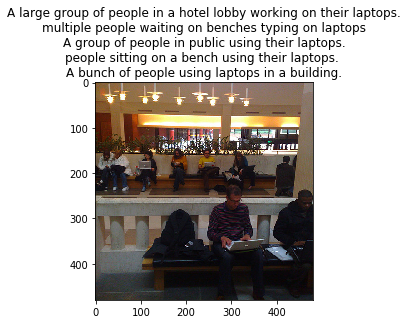

In [55]:
# look at training example (each has 5 captions)
def show_trainig_example(train_img_fns, train_captions, example_idx=0):
    """
    You can change example_idx and see different images
    """
    zf = zipfile.ZipFile("train2014_sample.zip")
    captions_by_file = dict(zip(train_img_fns, train_captions))
    print(captions_by_file)
    all_files = set(train_img_fns)
    print(len(all_files))
    print(len(train_img_fns))
    found_files = list(filter(lambda x: x.filename.rsplit("/")[-1] in all_files, zf.filelist))
    #print(found_files)
    example = found_files[example_idx]
    img = utils.decode_image_from_buf(zf.read(example))
    plt.imshow(utils.image_center_crop(img))
    plt.title("\n".join(captions_by_file[example.filename.rsplit("/")[-1]]))
    plt.show()
    
show_trainig_example(train_img_fns, train_captions, example_idx=155)

# Prepare captions for training

In [56]:
# preview captions data
train_captions[:2]

[['A long dirt road going through a forest.',
  'A SCENE OF WATER AND A PATH WAY',
  'A sandy path surrounded by trees leads to a beach.',
  'Ocean view through a dirt road surrounded by a forested area. ',
  'dirt path leading beneath barren trees to open plains'],
 ['A group of zebra standing next to each other.',
  'This is an image of of zebras drinking',
  'ZEBRAS AND BIRDS SHARING THE SAME WATERING HOLE',
  'Zebras that are bent over and drinking water together.',
  'a number of zebras drinking water near one another']]

In [57]:
# special tokens
PAD = "#PAD#"
UNK = "#UNK#"
START = "#START#"
END = "#END#"

# split sentence into tokens (split into lowercased words)
def split_sentence(sentence):
    return list(filter(lambda x: len(x) > 0, re.split('\W+', sentence.lower())))
from collections import Counter
def generate_vocabulary(train_captions):
    """
    Return {token: index} for all train tokens (words) that occur 5 times or more, 
        `index` should be from 0 to N, where N is a number of unique tokens in the resulting dictionary.
    Use `split_sentence` function to split sentence into tokens.
    Also, add PAD (for batch padding), UNK (unknown, out of vocabulary), 
        START (start of sentence) and END (end of sentence) tokens into the vocabulary.
    """
    
    flattened = [sentence for caption in train_captions for sentence in caption]
    flattened = split_sentence(' '.join(flattened))
    counter = Counter(flattened)
    vocab = [token for token, count in counter.items() if count>=5]
    vocab += [PAD, UNK, START, END]
    #vocab = ### YOUR CODE HERE ###
    return {token: index for index, token in enumerate(sorted(vocab))}
    
def caption_tokens_to_indices(captions, vocab):
    """
    `captions` argument is an array of arrays:
    [
        [
            "image1 caption1",
            "image1 caption2",
            ...
        ],
        [
            "image2 caption1",
            "image2 caption2",
            ...
        ],
        ...
    ]
    Use `split_sentence` function to split sentence into tokens.
    Replace all tokens with vocabulary indices, use UNK for unknown words (out of vocabulary).
    Add START and END tokens to start and end of each sentence respectively.
    For the example above you should produce the following:
    [
        [
            [vocab[START], vocab["image1"], vocab["caption1"], vocab[END]],
            [vocab[START], vocab["image1"], vocab["caption2"], vocab[END]],
            ...
        ],
        ...
    ]
    """
    #res = ### YOUR CODE HERE ###
    res = [[[vocab[START]] + [vocab[token] if token in vocab else vocab[UNK] for token in split_sentence(sentence)] + [vocab[END]] for sentence in caption] for caption in captions]
    return res

In [58]:
# prepare vocabulary
vocab = generate_vocabulary(train_captions)
vocab_inverse = {idx: w for w, idx in vocab.items()}
print(len(vocab))

8769


In [59]:
# replace tokens with indices
train_captions_indexed = caption_tokens_to_indices(train_captions, vocab)
val_captions_indexed = caption_tokens_to_indices(val_captions, vocab)

Captions have different length, but we need to batch them, that's why we will add PAD tokens so that all sentences have an euqal length. 

We will crunch LSTM through all the tokens, but we will ignore padding tokens during loss calculation.

In [60]:
# we will use this during training
def batch_captions_to_matrix(batch_captions, pad_idx, max_len=None):
    """
    `batch_captions` is an array of arrays:
    [
        [vocab[START], ..., vocab[END]],
        [vocab[START], ..., vocab[END]],
        ...
    ]
    Put vocabulary indexed captions into np.array of shape (len(batch_captions), columns),
        where "columns" is max(map(len, batch_captions)) when max_len is None
        and "columns" = min(max_len, max(map(len, batch_captions))) otherwise.
    Add padding with pad_idx where necessary.
    Input example: [[1, 2, 3], [4, 5]]
    Output example: np.array([[1, 2, 3], [4, 5, pad_idx]]) if max_len=None
    Output example: np.array([[1, 2], [4, 5]]) if max_len=2
    Output example: np.array([[1, 2, 3], [4, 5, pad_idx]]) if max_len=100
    Try to use numpy, we need this function to be fast!
    """
    #matrix = ###YOUR CODE HERE###
    if not max_len:
        max_len = len(max(batch_captions, key=lambda x:len(x)))
    else:
        max_len = min(max_len, len(max(batch_captions, key=lambda x:len(x))))
    matrix = [[index for i, index in enumerate(caption[:max_len])] + [pad_idx]*(max(max_len-len(caption),0)) for caption in batch_captions]
    return np.array(matrix)

In [61]:
## GRADED PART, DO NOT CHANGE!
# Vocabulary creation
grader.set_answer("19Wpv", grading_utils.test_vocab(vocab, PAD, UNK, START, END))
# Captions indexing
grader.set_answer("uJh73", grading_utils.test_captions_indexing(train_captions_indexed, vocab, UNK))
# Captions batching
grader.set_answer("yiJkt", grading_utils.test_captions_batching(batch_captions_to_matrix))

In [62]:
# you can make submission with answers so far to check yourself at this stage
grader.submit("kindresh44@gmail.com","TdMbHA6G5fTMMtdD" )

You used an invalid email or your token may have expired. Please make sure you have entered all fields correctly. Try generating a new token if the issue still persists.


In [63]:
# make sure you use correct argument in caption_tokens_to_indices
assert len(caption_tokens_to_indices(train_captions[:10], vocab)) == 10
assert len(caption_tokens_to_indices(train_captions[:5], vocab)) == 5

# Training

## Define architecture

Since our problem is to generate image captions, RNN text generator should be conditioned on image. The idea is to use image features as an initial state for RNN instead of zeros. 

Remember that you should transform image feature vector to RNN hidden state size by fully-connected layer and then pass it to RNN.

During training we will feed ground truth tokens into the lstm to get predictions of next tokens. 

Notice that we don't need to feed last token (END) as input (http://cs.stanford.edu/people/karpathy/):

<img src="images/encoder_decoder_explained.png" style="width:50%">

In [64]:
IMG_EMBED_SIZE = train_img_embeds.shape[1]
IMG_EMBED_BOTTLENECK = 120
WORD_EMBED_SIZE = 100
LSTM_UNITS = 300
LOGIT_BOTTLENECK = 120
pad_idx = vocab[PAD]

In [65]:
# remember to reset your graph if you want to start building it from scratch!
tf.reset_default_graph()
tf.set_random_seed(42)
s = tf.InteractiveSession()

Here we define decoder graph.

We use Keras layers where possible because we can use them in functional style with weights reuse like this:
```python
dense_layer = L.Dense(42, input_shape=(None, 100) activation='relu')
a = tf.placeholder('float32', [None, 100])
b = tf.placeholder('float32', [None, 100])
dense_layer(a)  # that's how we applied dense layer!
dense_layer(b)  # and again
```

Here's a figure to help you with flattening in decoder:
<img src="images/flatten_help.jpg" style="width:80%">

In [66]:
class decoder:
    # [batch_size, IMG_EMBED_SIZE] of CNN image features
    img_embeds = tf.placeholder('float32', [None, IMG_EMBED_SIZE])
    # [batch_size, time steps] of word ids
    sentences = tf.placeholder('int32', [None, None])
    
    # we use bottleneck here to reduce the number of parameters
    # image embedding -> bottleneck
    img_embed_to_bottleneck = L.Dense(IMG_EMBED_BOTTLENECK, 
                                      input_shape=(None, IMG_EMBED_SIZE), 
                                      activation='elu')
    # image embedding bottleneck -> lstm initial state
    img_embed_bottleneck_to_h0 = L.Dense(LSTM_UNITS,
                                         input_shape=(None, IMG_EMBED_BOTTLENECK),
                                         activation='elu')
    # word -> embedding
    word_embed = L.Embedding(len(vocab), WORD_EMBED_SIZE)
    # lstm cell (from tensorflow)
    lstm = tf.nn.rnn_cell.LSTMCell(LSTM_UNITS)
    
    # we use bottleneck here to reduce model complexity
    # lstm output -> logits bottleneck
    token_logits_bottleneck = L.Dense(LOGIT_BOTTLENECK, 
                                      input_shape=(None, LSTM_UNITS),
                                      activation="elu")
    # logits bottleneck -> logits for next token prediction
    token_logits = L.Dense(len(vocab),
                           input_shape=(None, LOGIT_BOTTLENECK))
    
    # initial lstm cell state of shape (None, LSTM_UNITS),
    # we need to condition it on `img_embeds` placeholder.
    c0 = h0 = img_embed_bottleneck_to_h0(img_embed_to_bottleneck(img_embeds))### YOUR CODE HERE ###

    # embed all tokens butimg_embed_bottleneck_to_h0(img_embed_to_bottleneck(img_embeds)) the last for lstm input,
    # remember that L.Embedding is callable,
    # use `sentences` placeholder as input.
    word_embeds = word_embed(sentences[:,:-1])### YOUR CODE HERE ###
    
    # during training we use ground truth tokens `word_embeds` as context for next token prediction.
    # that means that we know all the inputs for our lstm and can get 
    # all the hidden states with one tensorflow operation (tf.nn.dynamic_rnn).
    # `hidden_states` has a shape of [batch_size, time steps, LSTM_UNITS].
    hidden_states, _ = tf.nn.dynamic_rnn(lstm, word_embeds,
                                         initial_state=tf.nn.rnn_cell.LSTMStateTuple(c0, h0))

    # now we need to calculate token logits for all the hidden states
    
    # first, we reshape `hidden_states` to [-1, LSTM_UNITS]
    flat_hidden_states =tf.reshape(hidden_states, [-1, LSTM_UNITS]) ### YOUR CODE HERE ###

    # then, we calculate logits for next tokens using `token_logits_bottleneck` and `token_logits` layers
    flat_token_logits = token_logits(token_logits_bottleneck(flat_hidden_states))### YOUR CODE HERE ###
    
    # then, we flatten the ground truth token ids.
    # remember, that we predict next tokens for each time step,
    # use `sentences` placeholder.
    flat_ground_truth = tf.reshape(sentences[:,1:],[-1,])### YOUR CODE HERE ###

    # we need to know where we have real tokens (not padding) in `flat_ground_truth`,
    # we don't want to propagate the loss for padded output tokens,
    # fill `flat_loss_mask` with 1.0 for real tokens (not pad_idx) and 0.0 otherwise.
    flat_loss_mask = tf.not_equal(flat_ground_truth, pad_idx)### YOUR CODE HERE ###

    # compute cross-entropy between `flat_ground_truth` and `flat_token_logits` predicted by lstm
    xent = tf.nn.sparse_softmax_cross_entropy_with_logits(
        labels=flat_ground_truth, 
        logits=flat_token_logits
    )

    # compute average `xent` over tokens with nonzero `flat_loss_mask`.
    # we don't want to account misclassification of PAD tokens, because that doesn't make sense,
    # we have PAD tokens for batching purposes only!
    loss = tf.reduce_mean(tf.boolean_mask(xent, flat_loss_mask))### YOUR CODE HERE ###

In [67]:
# define optimizer operation to minimize the loss
optimizer = tf.train.AdamOptimizer(learning_rate=0.001)
train_step = optimizer.minimize(decoder.loss)

# will be used to save/load network weights.
# you need to reset your default graph and define it in the same way to be able to load the saved weights!
saver = tf.train.Saver()

# intialize all variables
s.run(tf.global_variables_initializer())

C:\Users\Indresh\Anaconda3\lib\site-packages\tensorflow\python\ops\gradients_impl.py:96: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "


In [68]:
## GRADED PART, DO NOT CHANGE!
# Decoder shapes test
grader.set_answer("rbpnH", grading_utils.test_decoder_shapes(decoder, IMG_EMBED_SIZE, vocab, s))
# Decoder random loss test
grader.set_answer("E2OIL", grading_utils.test_random_decoder_loss(decoder, IMG_EMBED_SIZE, vocab, s))

In [69]:
# you can make submission with answers so far to check yourself at this stage
grader.submit("kindresh44@gmail.com", "TdMbHA6G5fTMMtdD")

You used an invalid email or your token may have expired. Please make sure you have entered all fields correctly. Try generating a new token if the issue still persists.


## Training loop
Evaluate train and validation metrics through training and log them. Ensure that loss decreases.

In [70]:
train_captions_indexed = np.array(train_captions_indexed)
val_captions_indexed = np.array(val_captions_indexed)

In [71]:
# generate batch via random sampling of images and captions for them,
# we use `max_len` parameter to control the length of the captions (truncating long captions)
def generate_batch(images_embeddings, indexed_captions, batch_size, max_len=None):
    """
    `images_embeddings` is a np.array of shape [number of images, IMG_EMBED_SIZE].
    `indexed_captions` holds 5 vocabulary indexed captions for each image:
    [
        [
            [vocab[START], vocab["image1"], vocab["caption1"], vocab[END]],
            [vocab[START], vocab["image1"], vocab["caption2"], vocab[END]],
            ...
        ],
        ...
    ]
    Generate a random batch of size `batch_size`.
    Take random images and choose one random caption for each image.
    Remember to use `batch_captions_to_matrix` for padding and respect `max_len` parameter.
    Return feed dict {decoder.img_embeds: ..., decoder.sentences: ...}.
    """
    indx_batch = np.random.choice(range(len(images_embeddings)), batch_size, replace= False)
    batch_image_embeddings = images_embeddings[indx_batch] ### YOUR CODE HERE ###
    batch_captions = [caption[np.random.randint(5)] for caption in indexed_captions[indx_batch]]
    batch_captions_matrix = batch_captions_to_matrix(batch_captions, pad_idx, max_len=max_len)### YOUR CODE HERE ###
    
    return {decoder.img_embeds: batch_image_embeddings, 
            decoder.sentences: batch_captions_matrix}

In [72]:
batch_size = 64
n_epochs = 12
n_batches_per_epoch = 1000
n_validation_batches = 100  # how many batches are used for validation after each epoch

In [73]:
# you can load trained weights here
# you can load "weights_{epoch}" and continue training
# uncomment the next line if you need to load weights
# saver.restore(s, os.path.abspath("weights"))

Look at the training and validation loss, they should be decreasing!

In [74]:
# actual training loop
MAX_LEN = 20  # truncate long captions to speed up training

# to make training reproducible
np.random.seed(42)
random.seed(42)

for epoch in range(n_epochs):
    
    train_loss = 0
    pbar = tqdm.tqdm_notebook(range(n_batches_per_epoch))
    counter = 0
    for _ in pbar:
        train_loss += s.run([decoder.loss, train_step], 
                            generate_batch(train_img_embeds, 
                                           train_captions_indexed, 
                                           batch_size, 
                                           MAX_LEN))[0]
        counter += 1
        pbar.set_description("Training loss: %f" % (train_loss / counter))
        
    train_loss /= n_batches_per_epoch
    
    val_loss = 0
    for _ in range(n_validation_batches):
        val_loss += s.run(decoder.loss, generate_batch(val_img_embeds,
                                                       val_captions_indexed, 
                                                       batch_size, 
                                                       MAX_LEN))
    val_loss /= n_validation_batches
    
    print('Epoch: {}, train loss: {}, val loss: {}'.format(epoch, train_loss, val_loss))

    # save weights after finishing epoch
    saver.save(s, os.path.abspath("weights_{}".format(epoch)))
    
print("Finished!")

A Jupyter Widget

Exception in thread Thread-8:
Traceback (most recent call last):
  File "C:\Users\Indresh\Anaconda3\lib\threading.py", line 916, in _bootstrap_inner
    self.run()
  File "C:\Users\Indresh\Anaconda3\lib\site-packages\tqdm\_tqdm.py", line 144, in run
    for instance in self.tqdm_cls._instances:
  File "C:\Users\Indresh\Anaconda3\lib\_weakrefset.py", line 60, in __iter__
    for itemref in self.data:
RuntimeError: Set changed size during iteration




Epoch: 0, train loss: 4.317234139442444, val loss: 3.628547704219818


A Jupyter Widget


Epoch: 1, train loss: 3.319545659542084, val loss: 3.136240131855011


A Jupyter Widget


Epoch: 2, train loss: 3.0385565333366396, val loss: 2.984767017364502


A Jupyter Widget


Epoch: 3, train loss: 2.8920839631557467, val loss: 2.8966876435279847


A Jupyter Widget


Epoch: 4, train loss: 2.805889435529709, val loss: 2.832384762763977


A Jupyter Widget


Epoch: 5, train loss: 2.742068857192993, val loss: 2.771202230453491


A Jupyter Widget


Epoch: 6, train loss: 2.6832166090011595, val loss: 2.7415629386901856


A Jupyter Widget


Epoch: 7, train loss: 2.6421431217193603, val loss: 2.707463276386261


A Jupyter Widget


Epoch: 8, train loss: 2.6080674352645876, val loss: 2.656321873664856


A Jupyter Widget


Epoch: 9, train loss: 2.5732052397727965, val loss: 2.657317841053009


A Jupyter Widget


Epoch: 10, train loss: 2.5456519260406494, val loss: 2.6338363432884218


A Jupyter Widget


Epoch: 11, train loss: 2.5240589728355407, val loss: 2.620577108860016
Finished!


In [75]:
## GRADED PART, DO NOT CHANGE!
# Validation loss
grader.set_answer("YJR7z", grading_utils.test_validation_loss(
    decoder, s, generate_batch, val_img_embeds, val_captions_indexed))

A Jupyter Widget

In [85]:
# you can make submission with answers so far to check yourself at this stage
grader.submit("kindresh44@gmail.com", "7ZECpEvSE0B0xwHQ")

You used an invalid email or your token may have expired. Please make sure you have entered all fields correctly. Try generating a new token if the issue still persists.


In [86]:
# check that it's learnt something, outputs accuracy of next word prediction (should be around 0.5)
from sklearn.metrics import accuracy_score, log_loss

def decode_sentence(sentence_indices):
    return " ".join(list(map(vocab_inverse.get, sentence_indices)))

def check_after_training(n_examples):
    fd = generate_batch(train_img_embeds, train_captions_indexed, batch_size)
    logits = decoder.flat_token_logits.eval(fd)
    truth = decoder.flat_ground_truth.eval(fd)
    mask = decoder.flat_loss_mask.eval(fd).astype(bool)
    print("Loss:", decoder.loss.eval(fd))
    print("Accuracy:", accuracy_score(logits.argmax(axis=1)[mask], truth[mask]))
    for example_idx in range(n_examples):
        print("Example", example_idx)
        print("Predicted:", decode_sentence(logits.argmax(axis=1).reshape((batch_size, -1))[example_idx]))
        print("Truth:", decode_sentence(truth.reshape((batch_size, -1))[example_idx]))
        print("")

check_after_training(3)

Loss: 2.50896
Accuracy: 0.482625482625
Example 0
Predicted: a bananas and butter and a banana of bananas #END# #END# #END# #END# #END# #END# #END# #END# #END# #END# #END# #END# #END# #END# #END# #END# #END# #END# #END# #END# #END# #END# #END# #END# #END# #END# #END# #END# #END# #END# #END# #END# #END#
Truth: some bananas peanut butter and a jar of honey #END# #PAD# #PAD# #PAD# #PAD# #PAD# #PAD# #PAD# #PAD# #PAD# #PAD# #PAD# #PAD# #PAD# #PAD# #PAD# #PAD# #PAD# #PAD# #PAD# #PAD# #PAD# #PAD# #PAD# #PAD# #PAD# #PAD# #PAD# #PAD# #PAD# #PAD# #PAD# #PAD#

Example 1
Predicted: a giraffe giraffe standing through the and trees #END# #END# #END# #END# #END# #END# #END# #END# #END# #END# #END# #END# #END# #END# #END# #END# #END# #END# #END# #END# #END# #END# #END# #END# #END# #END# #END# #END# #END# #END# #END# #END# #END# #END#
Truth: a lone giraffe walks through bushes and grasses #END# #PAD# #PAD# #PAD# #PAD# #PAD# #PAD# #PAD# #PAD# #PAD# #PAD# #PAD# #PAD# #PAD# #PAD# #PAD# #PAD# #PAD# #PAD# #P

In [87]:
# save graph weights to file!
saver.save(s, os.path.abspath("weights"))

'C:\\Users\\Indresh\\intro-to-dl\\week6\\weights'

# Applying model

Here we construct a graph for our final model.

It will work as follows:
- take an image as an input and embed it
- condition lstm on that embedding
- predict the next token given a START input token
- use predicted token as an input at next time step
- iterate until you predict an END token

In [88]:
class final_model:
    # CNN encoder
    encoder, preprocess_for_model = get_cnn_encoder()
    saver.restore(s, os.path.abspath("weights"))  # keras applications corrupt our graph, so we restore trained weights
    
    # containers for current lstm state
    lstm_c = tf.Variable(tf.zeros([1, LSTM_UNITS]), name="cell")
    lstm_h = tf.Variable(tf.zeros([1, LSTM_UNITS]), name="hidden")

    # input images
    input_images = tf.placeholder('float32', [1, IMG_SIZE, IMG_SIZE, 3], name='images')

    # get image embeddings
    img_embeds = encoder(input_images)

    # initialize lstm state conditioned on image
    init_c = init_h = decoder.img_embed_bottleneck_to_h0(decoder.img_embed_to_bottleneck(img_embeds))
    init_lstm = tf.assign(lstm_c, init_c), tf.assign(lstm_h, init_h)
    
    # current word index
    current_word = tf.placeholder('int32', [1], name='current_input')

    # embedding for current word
    word_embed = decoder.word_embed(current_word)

    # apply lstm cell, get new lstm states
    new_c, new_h = decoder.lstm(word_embed, tf.nn.rnn_cell.LSTMStateTuple(lstm_c, lstm_h))[1]

    # compute logits for next token
    new_logits = decoder.token_logits(decoder.token_logits_bottleneck(new_h))
    # compute probabilities for next token
    new_probs = tf.nn.softmax(new_logits)

    # `one_step` outputs probabilities of next token and updates lstm hidden state
    one_step = new_probs, tf.assign(lstm_c, new_c), tf.assign(lstm_h, new_h)

INFO:tensorflow:Restoring parameters from C:\Users\Indresh\intro-to-dl\week6\weights


In [89]:
# look at how temperature works for probability distributions
# for high temperature we have more uniform distribution
_ = np.array([0.5, 0.4, 0.1])
for t in [0.01, 0.1, 1, 10, 100]:
    print(" ".join(map(str, _**(1/t) / np.sum(_**(1/t)))), "with temperature", t)

0.999999999796 2.03703597592e-10 1.26765059997e-70 with temperature 0.01
0.903037043325 0.0969628642039 9.24709932365e-08 with temperature 0.1
0.5 0.4 0.1 with temperature 1
0.353447726392 0.345648113606 0.300904160002 with temperature 10
0.335367280481 0.334619764349 0.33001295517 with temperature 100


In [90]:
# this is an actual prediction loop
def generate_caption(image, t=1, sample=False, max_len=20):
    """
    Generate caption for given image.
    if `sample` is True, we will sample next token from predicted probability distribution.
    `t` is a temperature during that sampling,
        higher `t` causes more uniform-like distribution = more chaos.
    """
    # condition lstm on the image
    s.run(final_model.init_lstm, 
          {final_model.input_images: [image]})
    
    # current caption
    # start with only START token
    caption = [vocab[START]]
    
    for _ in range(max_len):
        next_word_probs = s.run(final_model.one_step, 
                                {final_model.current_word: [caption[-1]]})[0]
        next_word_probs = next_word_probs.ravel()
        
        # apply temperature
        next_word_probs = next_word_probs**(1/t) / np.sum(next_word_probs**(1/t))

        if sample:
            next_word = np.random.choice(range(len(vocab)), p=next_word_probs)
        else:
            next_word = np.argmax(next_word_probs)

        caption.append(next_word)
        if next_word == vocab[END]:
            break
       
    return list(map(vocab_inverse.get, caption))

a baseball player swinging a bat at a baseball game


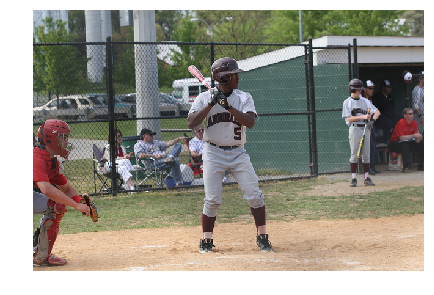

In [91]:
# look at validation prediction example
def apply_model_to_image_raw_bytes(raw):
    img = utils.decode_image_from_buf(raw)
    fig = plt.figure(figsize=(7, 7))
    plt.grid('off')
    plt.axis('off')
    plt.imshow(img)
    img = utils.crop_and_preprocess(img, (IMG_SIZE, IMG_SIZE), final_model.preprocess_for_model)
    print(' '.join(generate_caption(img)[1:-1]))
    plt.show()

def show_valid_example(val_img_fns, example_idx=0):
    zf = zipfile.ZipFile("val2014_sample.zip")
    all_files = set(val_img_fns)
    found_files = list(filter(lambda x: x.filename.rsplit("/")[-1] in all_files, zf.filelist))
    example = found_files[example_idx]
    apply_model_to_image_raw_bytes(zf.read(example))
    
show_valid_example(val_img_fns, example_idx=100)

a pair of scissors and a pair of scissors


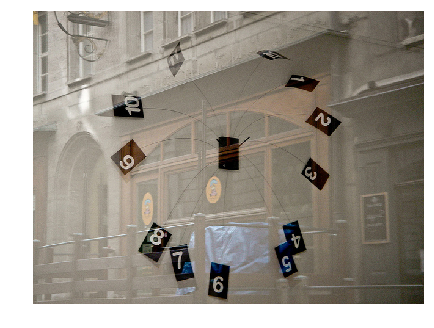

a pizza with a knife and a knife on a table


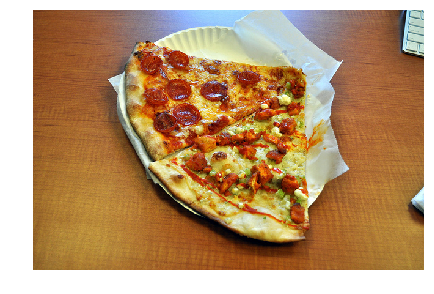

a man holding a frisbee in a park


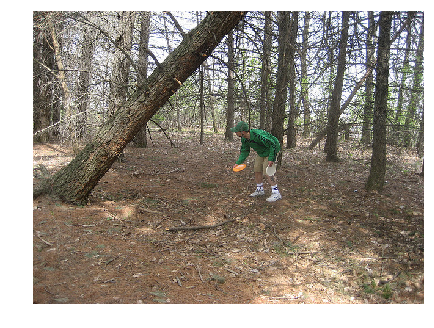

a kitchen with a stove and a refrigerator


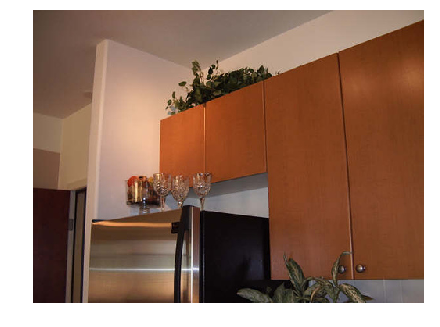

a tennis player is hitting the ball with his racket


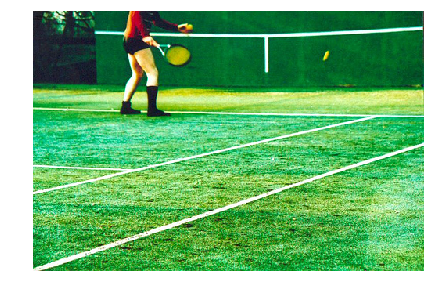

a man in a black jacket and a snowboard


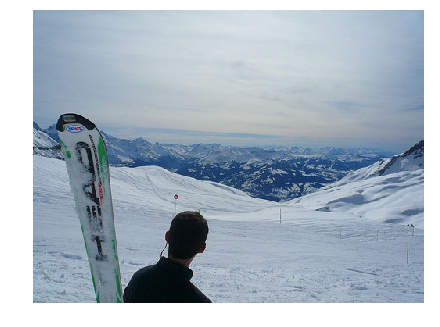

a baseball player swinging a bat at a baseball game


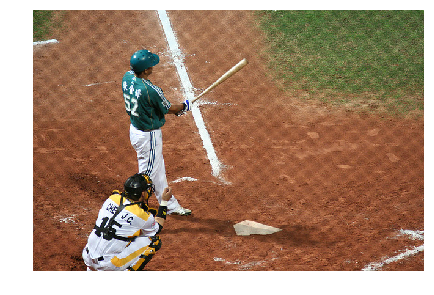

a baseball player swinging a bat at a baseball game


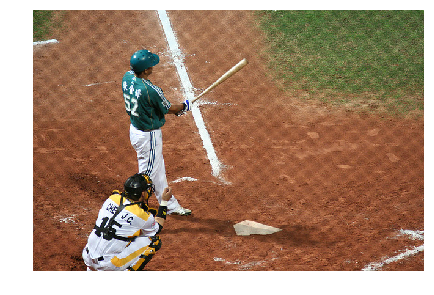

a large body of water with a clock tower


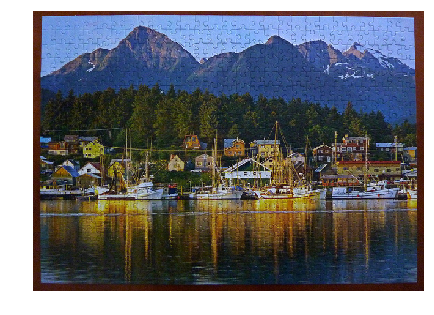

a man holding a cell phone in his hand


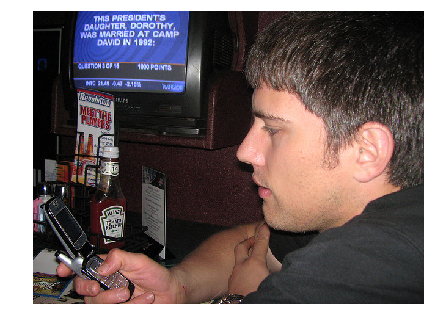

In [92]:
# sample more images from validation
for idx in np.random.choice(range(len(zipfile.ZipFile("val2014_sample.zip").filelist) - 1), 10):
    show_valid_example(val_img_fns, example_idx=idx)
    time.sleep(1)

You can download any image from the Internet and appply your model to it!

In [93]:
download_utils.download_file(
    "http://www.bijouxandbits.com/wp-content/uploads/2016/06/portal-cake-10.jpg",
    "portal-cake-10.jpg"
)

A Jupyter Widget

a cake with a fork and knife on it


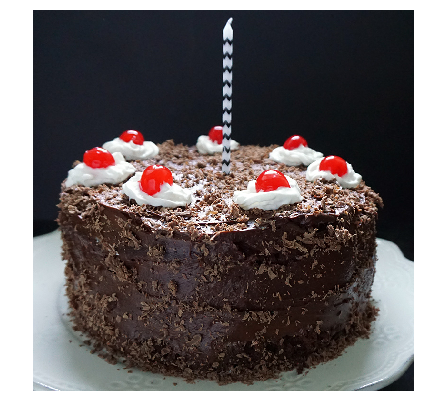

In [94]:
apply_model_to_image_raw_bytes(open("portal-cake-10.jpg", "rb").read())

Now it's time to find 10 examples where your model works good and 10 examples where it fails! 

You can use images from validation set as follows:
```python
show_valid_example(val_img_fns, example_idx=...)
```

You can use images from the Internet as follows:
```python
! wget ...
apply_model_to_image_raw_bytes(open("...", "rb").read())
```

If you use these functions, the output will be embedded into your notebook and will be visible during peer review!

When you're done, download your noteboook using "File" -> "Download as" -> "Notebook" and prepare that file for peer review!

## 10 good example

a herd of zebras standing next to each other


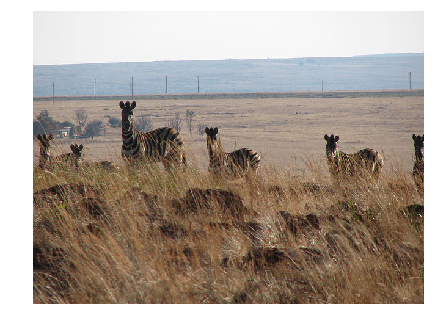

a train traveling down a train track next to a building


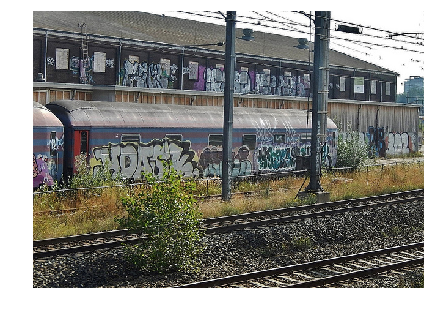

a man standing next to a elephant with a baby elephant


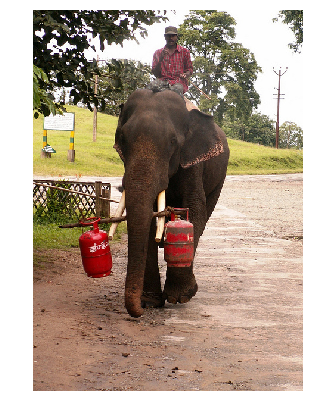

a young boy in a red jacket standing on a snow covered slope


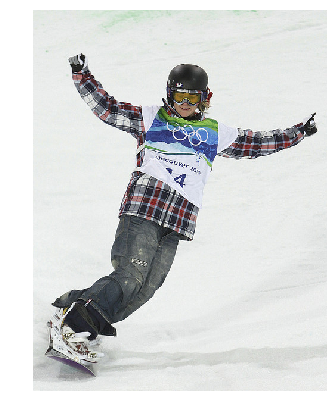

a sign that is on a pole in front of a building


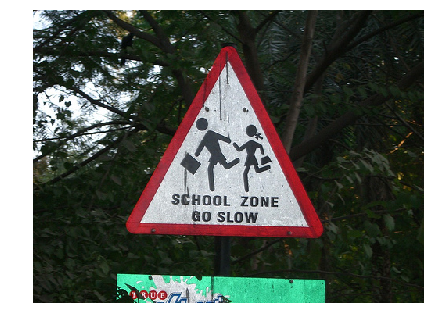

a slice of pizza with a fork and fork


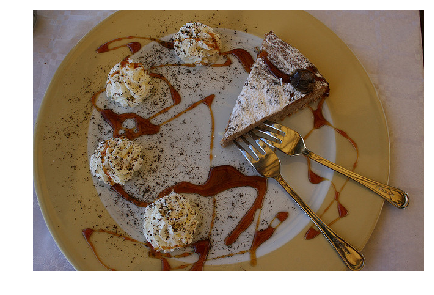

a pizza cooking in a pan on a counter


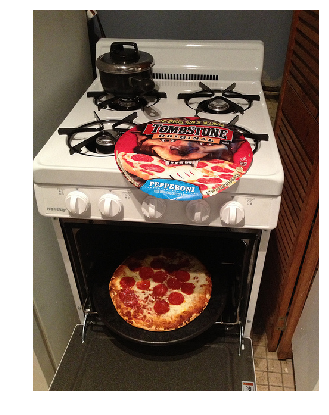

a bathroom with a sink and mirror in it


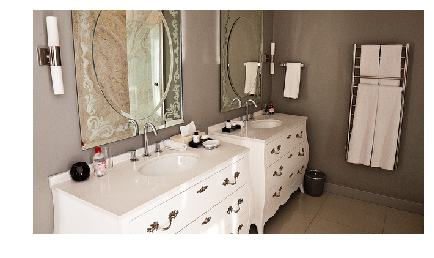

a group of people standing on a beach holding a surfboard


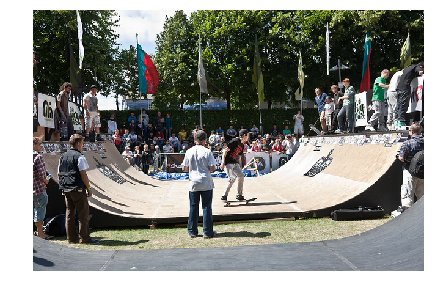

a bathroom with a sink and mirror in it


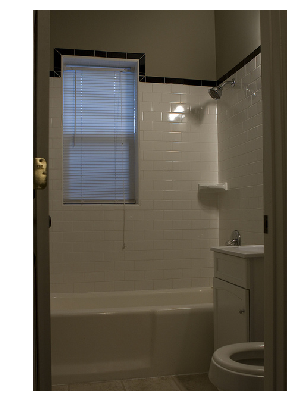

In [95]:
### YOUR EXAMPLES HERE ###
for idx in [300, 76, 364, 83, 247, 324, 391, 53, 102, 335]:
    show_valid_example(val_img_fns, example_idx=idx)
    time.sleep(1)

## 10 example where it fails

A Jupyter Widget


a small toy bird in a field with a tree


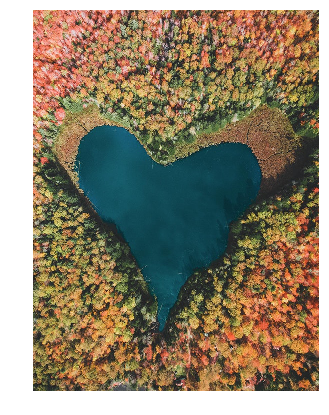

A Jupyter Widget


a man holding a surfboard in the sand


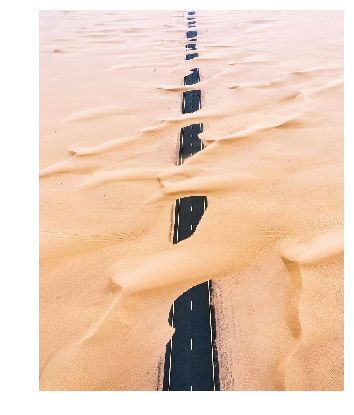

A Jupyter Widget


a plane is parked on the side of a building


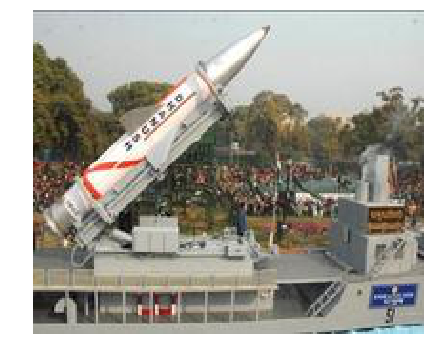

int() argument must be a string, a bytes-like object or a number, not 'NoneType', retrying in 3 seconds...


Traceback (most recent call last):
  File "..\download_utils.py", line 22, in f_retry
    return f(*args, **kwargs)
  File "..\download_utils.py", line 41, in download_file
    total_size = int(r.headers.get('content-length'))
TypeError: int() argument must be a string, a bytes-like object or a number, not 'NoneType'


A Jupyter Widget


a giraffe standing in a field with a tree in the background


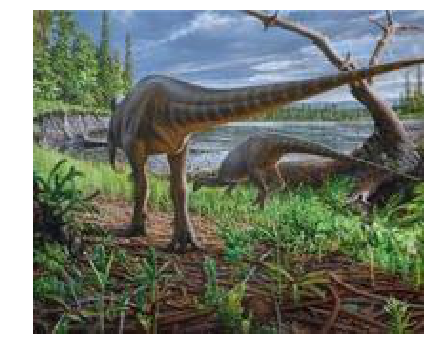

A Jupyter Widget


a pair of skis that are in the snow


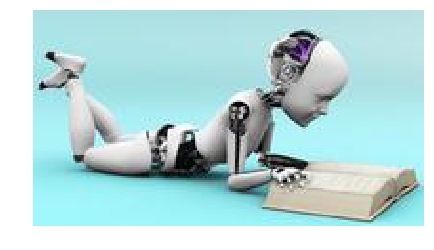

A Jupyter Widget


a green field with a green field and grass


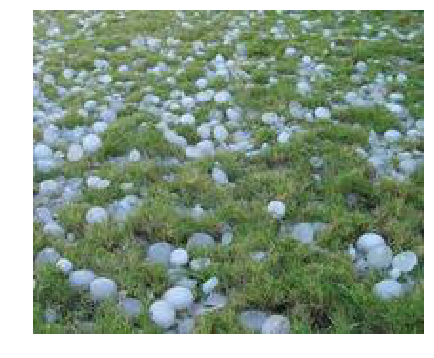

A Jupyter Widget


a group of people standing next to each other


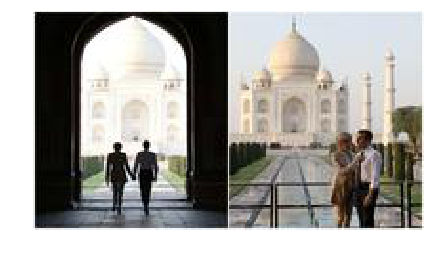

int() argument must be a string, a bytes-like object or a number, not 'NoneType', retrying in 3 seconds...


Traceback (most recent call last):
  File "..\download_utils.py", line 22, in f_retry
    return f(*args, **kwargs)
  File "..\download_utils.py", line 41, in download_file
    total_size = int(r.headers.get('content-length'))
TypeError: int() argument must be a string, a bytes-like object or a number, not 'NoneType'


int() argument must be a string, a bytes-like object or a number, not 'NoneType', retrying in 6 seconds...


Traceback (most recent call last):
  File "..\download_utils.py", line 22, in f_retry
    return f(*args, **kwargs)
  File "..\download_utils.py", line 41, in download_file
    total_size = int(r.headers.get('content-length'))
TypeError: int() argument must be a string, a bytes-like object or a number, not 'NoneType'


A Jupyter Widget


a bird sitting on a tree branch in a garden


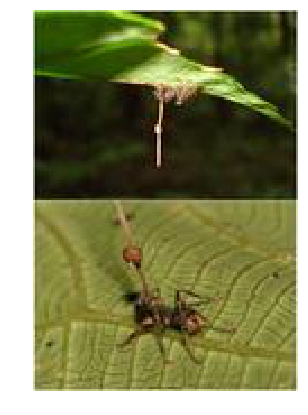

int() argument must be a string, a bytes-like object or a number, not 'NoneType', retrying in 3 seconds...


Traceback (most recent call last):
  File "..\download_utils.py", line 22, in f_retry
    return f(*args, **kwargs)
  File "..\download_utils.py", line 41, in download_file
    total_size = int(r.headers.get('content-length'))
TypeError: int() argument must be a string, a bytes-like object or a number, not 'NoneType'


A Jupyter Widget


a man holding a book and a book on a bed


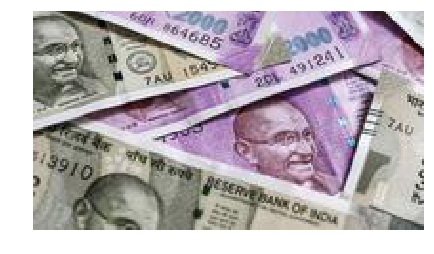

A Jupyter Widget


a pair of skis that are in the air


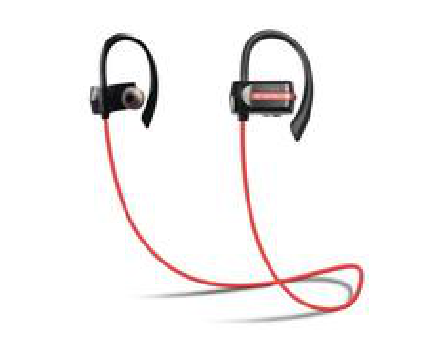

In [112]:
download_utils.download_file(
    "https://i.redditmedia.com/LZ7GHfDPMUHR6RRxEYdOe-7U2-VB4ZRUrUo0B5voZto.jpg?w=575&s=c7398b8f7d1c9ec8314e8673dc9ca47c",
    "lake.jpg"
)
apply_model_to_image_raw_bytes(open("lake.jpg", "rb").read())
download_utils.download_file(
    "https://i.imgur.com/OjnWerx.jpg",
    "sand_road.jpg"
)
apply_model_to_image_raw_bytes(open("sand_road.jpg", "rb").read())

download_utils.download_file(
    "http://n01.rcdn.in/thumbnail2/933ef9c125a117e6.jpg",
    "rocket.jpg"
)
apply_model_to_image_raw_bytes(open("rocket.jpg", "rb").read())

download_utils.download_file(
    "http://n03.rcdn.in/thumbnail2/91837a5e6be319a2.jpg",
    "dinosaur.jpg"
)
apply_model_to_image_raw_bytes(open("dinosaur.jpg", "rb").read())

download_utils.download_file(
    "http://n03.rcdn.in/thumbnail2/47a9152d4f7b0f0f.jpg",
    "robo.jpg"
)
apply_model_to_image_raw_bytes(open("robo.jpg", "rb").read())


download_utils.download_file(
    "http://n05.rcdn.in/thumbnail2/419da5037e2b27f8.jpg",
    "ice.jpg"
)
apply_model_to_image_raw_bytes(open("ice.jpg", "rb").read())


download_utils.download_file(
    "http://n04.rcdn.in/thumbnail2/bd378ade3a693934.jpg",
    "taj.jpg"
)
apply_model_to_image_raw_bytes(open("taj.jpg", "rb").read())


download_utils.download_file(
    "http://n04.rcdn.in/thumbnail2/c568f35a7feae42a.jpg",
    "insect.jpg"
)
apply_model_to_image_raw_bytes(open("insect.jpg", "rb").read())

download_utils.download_file(
    "http://n04.rcdn.in/thumbnail2/fb74948cf94065ef.jpg",
    "notes.jpg"
)
apply_model_to_image_raw_bytes(open("notes.jpg", "rb").read())

download_utils.download_file(
    "http://n04.rcdn.in/thumbnail2/38caf64094301b15.jpg",
    "earphones.jpg"
)
apply_model_to_image_raw_bytes(open("earphones.jpg", "rb").read())


That's it! 

Congratulations, you've trained your image captioning model and now can produce captions for any picture from the  Internet!